<div style="text-align: center; font-size: 24px; font-weight: bold;">
Global Terrorism Analysis</div>

# Introduction

This analysis delves into **global terrorism trends**, exploring how terrorist activities have evolved over time and identifying regions with significant deviations from global patterns. By examining attack success rates, prevalent tactics, and regional variations, we aim to uncover key insights into the nature of terrorist incidents worldwide. This exploration utilizes interactive plots and geographic visualizations to enhance understanding and engagement.

---

# About the Dataset

The dataset, sourced from the **Global Terrorism Database (GTD)**, provides comprehensive data on over **180,000 terrorist attacks** from 1970 to 2017. Managed by the National Consortium for the Study of Terrorism and Responses to Terrorism (START), this open-source repository offers detailed information on both domestic and international incidents, enabling a thorough examination of global terrorism trends.

---

**Key Features:**
- **Time Span:** 1970 - 2017
- **Number of Incidents:** 180,000+
- **Scope:** Domestic and International
- **Data Limitations:** The dataset may have biases or gaps due to underreporting or varying definitions of terrorism



# Project steps

` First `
+  Download Dataset & load :- [ https://drive.google.com/drive/folders/1KxVUhXePXaQBzBz9kMHEMl3lCjt3C-4P?usp=drive_link]

`second`
+ import nessary libraries

` third ` 
+ Let's dive deep into the data to find out 

---

In [1]:
# Import Libraries
import pandas as pd
import numpy as np
import os
import chardet
import missingno as msno
import time
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import cartopy.crs as ccrs
import cartopy.feature
import io
import base64
from IPython.display import HTML
# plt.style.use('ggplot')

import warnings
warnings.filterwarnings('ignore')

In [2]:
# extra_addition
pd.set_option('display.max_columns', 1000)  # Show 1000 columns
pd.set_option('display.max_rows', 1000)    # Show 1000 rows

In [3]:
path = os.path.join(os.getcwd(),"globalterrorismdb_0718dist.csv")
path

'F:\\from_C\\proj_jupyter\\globalterrorismdb_0718dist.csv'

### After download data on local machine check what is encoding using to encode data for this using ( chardet ) to define type data to avoid down UnicodeDecodeError.

In [4]:
# If you don't have chardet installed, uncomment the line below to install it:
# !pip install chardet

In [5]:
with open(path,"rb") as obj:
    res= chardet.detect(obj.read(10000))
print(res)

{'encoding': 'ISO-8859-1', 'confidence': 0.73, 'language': ''}


# - Load and Explore the dataset

In [6]:
start_time = time.time()

df = pd.read_csv("globalterrorismdb_0718dist.csv",encoding='ISO-8859-1',low_memory=False)

pandas_duration = time.time() - start_time

pandas_duration

18.8396315574646

In [7]:
df.head()

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,region_txt,provstate,city,latitude,longitude,specificity,vicinity,location,summary,crit1,crit2,crit3,doubtterr,alternative,alternative_txt,multiple,success,suicide,attacktype1,attacktype1_txt,attacktype2,attacktype2_txt,attacktype3,attacktype3_txt,targtype1,targtype1_txt,targsubtype1,targsubtype1_txt,corp1,target1,natlty1,natlty1_txt,targtype2,targtype2_txt,targsubtype2,targsubtype2_txt,corp2,target2,natlty2,natlty2_txt,targtype3,targtype3_txt,targsubtype3,targsubtype3_txt,corp3,target3,natlty3,natlty3_txt,gname,gsubname,gname2,gsubname2,gname3,gsubname3,motive,guncertain1,guncertain2,guncertain3,individual,nperps,nperpcap,claimed,claimmode,claimmode_txt,claim2,claimmode2,claimmode2_txt,claim3,claimmode3,claimmode3_txt,compclaim,weaptype1,weaptype1_txt,weapsubtype1,weapsubtype1_txt,weaptype2,weaptype2_txt,weapsubtype2,weapsubtype2_txt,weaptype3,weaptype3_txt,weapsubtype3,weapsubtype3_txt,weaptype4,weaptype4_txt,weapsubtype4,weapsubtype4_txt,weapdetail,nkill,nkillus,nkillter,nwound,nwoundus,nwoundte,property,propextent,propextent_txt,propvalue,propcomment,ishostkid,nhostkid,nhostkidus,nhours,ndays,divert,kidhijcountry,ransom,ransomamt,ransomamtus,ransompaid,ransompaidus,ransomnote,hostkidoutcome,hostkidoutcome_txt,nreleased,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,197000000001,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,Central America & Caribbean,NaN,Santo Domingo,18.456792,-69.951164,1.0,0,NaN,NaN,1,1,1,0.0,NaN,NaN,0.0,1,0,1,Assassination,NaN,NaN,NaN,NaN,14,Private Citizens & Property,68.0,Named Civilian,NaN,Julio Guzman,58.0,Dominican Republic,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,MANO-D,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,1,North America,Federal,Mexico city,19.371887,-99.086624,1.0,0,NaN,NaN,1,1,1,0.0,NaN,NaN,0.0,1,0,6,Hostage Taking (Kidnapping),NaN,NaN,NaN,NaN,7,Government (Diplomatic),45.0,"Diplomatic Personnel (outside of embassy, cons...",Belgian Ambassador Daughter,"Nadine Chaval, daughter",21.0,Belgium,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23rd of September Communist League,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0,7.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,1.0,1.0,0.0,NaN,NaN,NaN,Mexico,1.0,800000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,197001000001,1970,1,0,NaN,0,NaN,160,Philippines,5,Southeast Asia,Tarlac,Unknown,15.478598,120.599741,4.0,0,NaN,NaN,1,1,1,0.0,NaN,NaN,0.0,1,0,1,Assassination,NaN,NaN,NaN,NaN,10,Journalists & Media,54.0,Radio Journalist/Staff/Facility,Voice of America,Employee,217.0,United States,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
3,197001000002,1970,1,0,NaN,0,NaN,78,Greece,8,Western Europe,Attica,Athens,37.997490,23.762728,1.0,0,NaN,NaN,1,1,1,0.0,NaN,NaN,0.0,1,0,3,Bombing/Explosion,NaN,NaN,NaN,NaN,7,Government (Diplomatic),46.0,Embassy/Consulate,NaN,U.S. Embassy,217.0,United States,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6,Explosives,16.0,Unknown Explosive Type,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Explosive,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN

In [8]:
df.shape

(181691, 135)

In [9]:
df.columns.to_list()

['eventid',
 'iyear',
 'imonth',
 'iday',
 'approxdate',
 'extended',
 'resolution',
 'country',
 'country_txt',
 'region',
 'region_txt',
 'provstate',
 'city',
 'latitude',
 'longitude',
 'specificity',
 'vicinity',
 'location',
 'summary',
 'crit1',
 'crit2',
 'crit3',
 'doubtterr',
 'alternative',
 'alternative_txt',
 'multiple',
 'success',
 'suicide',
 'attacktype1',
 'attacktype1_txt',
 'attacktype2',
 'attacktype2_txt',
 'attacktype3',
 'attacktype3_txt',
 'targtype1',
 'targtype1_txt',
 'targsubtype1',
 'targsubtype1_txt',
 'corp1',
 'target1',
 'natlty1',
 'natlty1_txt',
 'targtype2',
 'targtype2_txt',
 'targsubtype2',
 'targsubtype2_txt',
 'corp2',
 'target2',
 'natlty2',
 'natlty2_txt',
 'targtype3',
 'targtype3_txt',
 'targsubtype3',
 'targsubtype3_txt',
 'corp3',
 'target3',
 'natlty3',
 'natlty3_txt',
 'gname',
 'gsubname',
 'gname2',
 'gsubname2',
 'gname3',
 'gsubname3',
 'motive',
 'guncertain1',
 'guncertain2',
 'guncertain3',
 'individual',
 'nperps',
 'nperpcap',
 

In [10]:
# rename some columns which needed it to exploring. 
df.rename(columns={'eventid':'id','iyear':'Year','imonth':'Month','iday':'Day','country_txt':'Country','provstate':'State',
                       'region_txt':'Region','attacktype1_txt':'AttackType','target1':'Target','nkill':'Killed',
                       'nwound':'Wounded','summary':'Summary','gname':'Group','targtype1_txt':'Target_type',
                       'weaptype1_txt':'Weapon_type','motive':'Motive'},inplace=True )

# Cheat Sheet showing the missing value & some other features!!

In [11]:

summary = pd.DataFrame({
    'Column Name': df.columns,
    'Data Type': df.dtypes,
    'Number of Nulls': df.isnull().sum(),
    'Percentage of Nulls': (df.isnull().sum() / len(df)) * 100,
    'Count of Non-Null Data': df.notnull().sum(),
    'number Unique Values': df.nunique()
})

summary['Percentage of Nulls'] = summary['Percentage of Nulls'].map('{:.4f}%'.format)

# # Ensure column names are unique
# summary.columns = [f'{col}_{i}' if summary.columns.tolist().count(col) > 1 else col
#                    for i, col in enumerate(summary.columns)]

# # Define a function to highlight rows where Number of Nulls > 0
# def highlight_nulls(row):
#     return ['background-color: yellow' if row['Number of Nulls'] > 0 else '' for _ in row]

# # Apply the styling to the DataFrame
# styled_summary = summary.style.apply(highlight_nulls, axis=1)

# # Display the styled DataFrame
# styled_summary

summary = summary.reset_index(drop=True)
summary.set_index('Column Name', inplace=True)

In [12]:
summary.T

Column Name,id,Year,Month,Day,approxdate,extended,resolution,country,Country,region,Region,State,city,latitude,longitude,specificity,vicinity,location,Summary,crit1,crit2,crit3,doubtterr,alternative,alternative_txt,multiple,success,suicide,attacktype1,AttackType,attacktype2,attacktype2_txt,attacktype3,attacktype3_txt,targtype1,Target_type,targsubtype1,targsubtype1_txt,corp1,Target,natlty1,natlty1_txt,targtype2,targtype2_txt,targsubtype2,targsubtype2_txt,corp2,target2,natlty2,natlty2_txt,targtype3,targtype3_txt,targsubtype3,targsubtype3_txt,corp3,target3,natlty3,natlty3_txt,Group,gsubname,gname2,gsubname2,gname3,gsubname3,Motive,guncertain1,guncertain2,guncertain3,individual,nperps,nperpcap,claimed,claimmode,claimmode_txt,claim2,claimmode2,claimmode2_txt,claim3,claimmode3,claimmode3_txt,compclaim,weaptype1,Weapon_type,weapsubtype1,weapsubtype1_txt,weaptype2,weaptype2_txt,weapsubtype2,weapsubtype2_txt,weaptype3,weaptype3_txt,weapsubtype3,weapsubtype3_txt,weaptype4,weaptype4_txt,weapsubtype4,weapsubtype4_txt,weapdetail,Killed,nkillus,nkillter,Wounded,nwoundus,nwoundte,property,propextent,propextent_txt,propvalue,propcomment,ishostkid,nhostkid,nhostkidus,nhours,ndays,divert,kidhijcountry,ransom,ransomamt,ransomamtus,ransompaid,ransompaidus,ransomnote,hostkidoutcome,hostkidoutcome_txt,nreleased,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
Data Type,int64,int64,int64,int64,object,int64,object,int64,object,int64,object,object,object,float64,float64,float64,int64,object,object,int64,int64,int64,float64,float64,object,float64,int64,int64,int64,object,float64,object,float64,object,int64,object,float64,object,object,object,float64,object,float64,object,float64,object,object,object,float64,object,float64,object,float64,object,object,object,float64,object,object,object,object,object,object,object,object,float64,float64,float64,int64,float64,float64,float64,float64,object,float64,float64,object,float64,float64,object,float64,int64,object,float64,object,float64,object,float64,object,float64,object,float64,object,float64,object,float64,object,object,float64,float64,float64,float64,float64,float64,int64,float64,object,float64,object,float64,float64,float64,float64,float64,object,object,float64,float64,float64,float64,float64,object,float64,object,float64,object,object,object,object,object,int64,int64,int64,int64,object
Number of Nulls,0,0,0,0,172452,0,179471,0,0,0,0,421,435,4556,4557,6,0,126196,66129,0,0,0,1,152680,152680,1,0,0,0,0,175377,175377,181263,181263,0,0,10373,10373,42552,638,1559,1559,170547,170547,171006,171006,171574,170671,170863,170863,180515,180515,180594,180594,180665,180516,180544,180544,0,175801,179678,181531,181367,181671,131130,380,179736,181371,0,71115,69489,66120,162608,162608,179801,181075,181075,181373,181558,181558,176852,0,0,20768,20768,168564,168564,170149,170149,179828,179828,179998,179998,181618,181618,181621,181621,67670,10313,64446,66958,16311,64702,69143,0,117626,117626,142702,123732,178,168119,168174,177628,173567,181367,178386,104310,180341,181128,180917,181139,181179,170700,170700,171291,153402,66191,104758,138175,0,0,0,0,0,156653
Percentage of Nulls,0.0000%,0.0000%,0.0000%,0.0000%,94.9150%,0.0000%,98.7781%,0.0000%,0.0000%,0.0000%,0.0000%,0.2317%,0.2394%,2.5076%,2.5081%,0.0033%,0.0000%,69.4564%,36.3964%,0.0000%,0.0000%,0.0000%,0.0006%,84.0328%,84.0328%,0.0006%,0.0000%,0.0000%,0.0000%,0.0000%,96.5249%,96.5249%,99.7644%,99.7644%,0.0000%,0.0000%,5.7091%,5.7091%,23.4200%,0.3511%,0.8581%,0.8581%,93.8665%,93.8665%,94.1191%,94.1191%,94.4318%,93.9348%,94.0404%,94.0404%,99.3527%,99.3527%,99.3962%,99.3962%,99.4353%,99.3533%,99.3687%,99.3687%,0.0000%,96.7582%,98.8921%,99.9119%,99.8217%,99.9890%,72.1720%,0.2091%,98.9240%,99.8239%,0.0000%,39.1406%,38.2457%,36.3915%,89.4970%,89.4970%,98.9598%,99.6610%,99.6610%,99.8250%,99.9268%,99.9268%,97.3367%,0.0000%,0.0000%,11.4304%,11.4304%,92.7751%,92.7751%,93.6475%,93.6475%,98.9746%,98.9746%,99.0682%,99.0682%,99.9598%,99.9598%,99.9615%,99.9615%,37

In [13]:
# ((df.isna().sum()/len(df))*100).sort_values()

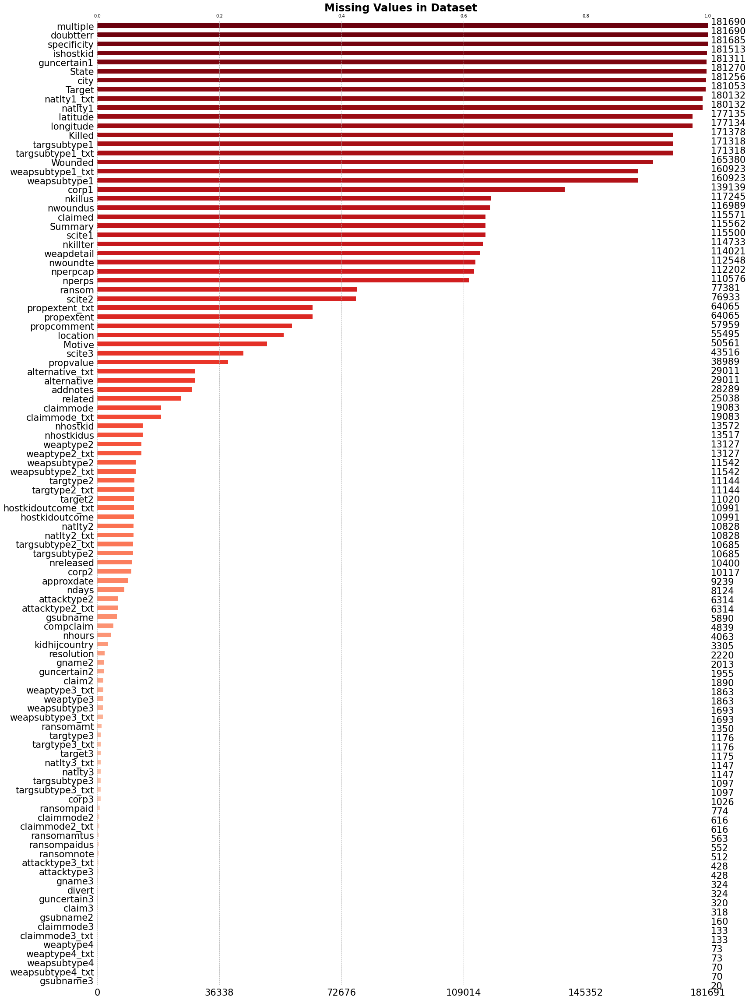

In [14]:
# A plot shows just how much the data is missing values
plt.style.use('default')
missing_values = df.isna().sum()
miss_value = missing_values[missing_values > 0]

# rest_miss = len(df)- miss_value
# rest_miss [miss_value.index]

msno.bar(df[miss_value.index],fontsize=21,sort="ascending",color=sns.color_palette("Reds", len(miss_value)))
plt.title('Missing Values in Dataset ', fontsize=24, weight='bold')
plt.grid(axis='x', linestyle='--', linewidth=0.9, alpha=0.9)
plt.show()
# msno.bar(df,fontsize=21,color="b",sort="descending")


In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Columns: 135 entries, id to related
dtypes: float64(55), int64(22), object(58)
memory usage: 187.1+ MB


In [16]:
df.dtypes.value_counts()

object     58
float64    55
int64      22
Name: count, dtype: int64

In [17]:
df.iloc[:,1:].describe()

,Year,Month,Day,extended,country,region,latitude,longitude,specificity,vicinity,crit1,crit2,crit3,doubtterr,alternative,multiple,success,suicide,attacktype1,attacktype2,attacktype3,targtype1,targsubtype1,natlty1,targtype2,targsubtype2,natlty2,targtype3,targsubtype3,natlty3,guncertain1,guncertain2,guncertain3,individual,nperps,nperpcap,claimed,claimmode,claim2,claimmode2,claim3,claimmode3,compclaim,weaptype1,weapsubtype1,weaptype2,weapsubtype2,weaptype3,weapsubtype3,weaptype4,weapsubtype4,Killed,nkillus,nkillter,Wounded,nwoundus,nwoundte,property,propextent,propvalue,ishostkid,nhostkid,nhostkidus,nhours,ndays,ransom,ransomamt,ransomamtus,ransompaid,ransompaidus,hostkidoutcome,nreleased,INT_LOG,INT_IDEO,INT_MISC,INT_ANY
count,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,177135.000000,1.771340e+05,181685.000000,181691.000000,181691.000000,181691.000000,181691.000000,181690.000000,29011.000000,181690.000000,181691.000000,181691.000000,181691.000000,6314.000000,428.000000,181691.000000,171318.000000,180132.000000,11144.000000,10685.000000,10828.000000,1176.000000,1097.000000,1147.000000,181311.000000,1955.000000,320.000000,181691.000000,110576.000000,112202.000000,115571.000000,19083.000000,1890.000000,616.000000,318.000000,133.000000,4839.000000,181691.000000,160923.000000,13127.000000,11542.000000,1863.000000,1693.000000,73.000000,70.000000,171378.000000,117245.000000,114733.000000,165380.000000,116989.000000,112548.000000,181691.000000,64065.000000,3.898900e+04,181513.000000,13572.000000,13517.000000,4063.000000,8124.000000,77381.000000,1.350000e+03,5.630000e+02,7.740000e+02,552.000000,10991.000000,10400.000000,181691.000000,181691.000000,181691.000000,181691.000000
mean,2002.638997,6.467277,15.505644,0.045346,131.968501,7.160938,23.498343,-4.586957e+02,1.451452,0.068297,0.988530,0.993093,0.875668,-0.523171,1.292923,0.137773,0.889598,0.036507,3.247547,3.719512,5.245327,8.439719,46.971474,127.686441,10.247218,55.311652,131.179442,10.021259,55.548769,144.564952,0.081440,0.265473,0.193750,0.002950,-65.361154,-1.517727,0.049666,7.022848,0.247619,7.176948,0.411950,6.729323,-6.296342,6.447325,11.117162,6.812524,10.754029,6.911433,11.643237,6.246575,10.842857,2.403272,0.045981,0.508058,3.167668,0.038944,0.107163,-0.544556,3.295403,2.088119e+05,0.059054,4.533230,-0.353999,-46.793933,-32.516371,-0.145811,3.172530e+06,5.784865e+05,7.179437e+05,240.378623,4.629242,-29.018269,-4.543731,-4.464398,0.090010,-3.945952
std,13.259430,3.388303,8.814045,0.208063,112.414535,2.933408,18.569242,2.047790e+05,0.995430,0.284553,0.106483,0.082823,0.329961,2.455819,0.703729,0.344663,0.313391,0.187549,1.915772,2.272023,2.246642,6.653838,30.953357,89.299120,5.709076,25.640310,125.951485,5.723447,26.288955,163.299295,0.273511,0.441698,0.395854,0.054234,216.536633,12.830346,1.093195,2.476851,0.974018,2.783725,0.492962,2.908003,4.234620,2.173435,6.495612,2.277081,7.594574,2.177956,8.493166,1.507212,8.192672,11.545741,5.681854,4.199937,35.949392,3.057361,1.488881,3.122889,0.486912,1.552463e+07,0.461244,202.316386,6.835645,82.800405,121.209205,1.207861,3.021157e+07,7.077924e+06,1.014392e+07,2940.967293,2.035360,65.720119,4.543547,4.637152,0.568457,4.691325
min,1970.000000,0.000000,0.000000,0.000000,4.000000,1.000000,-53.154613,-8.618590e+07,1.000000,-9.000000,0.000000,0.000000,0.000000,-9.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,4.000000,1.000000,1.000000,4.000000,1.000000,1.000000,4.000000,0.000000,0.000000,0.000000,0.000000,-99.000000,-99.000000,-9.000000,1.000000,-9.000000,1.000000,0.000000,1.000000,-9.000000,1.000000,1.000000,1.000000,1.000000,2.000000,1.000000,5.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-9.000000,1.000000,-9.900000e+01,-9.000000,-99.000000,-99.000000,-99.000000,-99.000000,-9.000000,-9.900000e+01,-9.900000e+01,-9.900000e+01,-99.000000,1.000000,-99.000000,-9.000000,-9.000000,-9.000000,-9.000000
25%,1991.000000,4.000000,8.000000,0.0

In [18]:
missing_values = df.isna().sum()
miss_value_prec = (missing_values[missing_values > 0]/len(df))*100
miss_value = missing_values[missing_values > 0]
miss_value


approxdate            172452
resolution            179471
State                    421
city                     435
latitude                4556
longitude               4557
specificity                6
location              126196
Summary                66129
doubtterr                  1
alternative           152680
alternative_txt       152680
multiple                   1
attacktype2           175377
attacktype2_txt       175377
attacktype3           181263
attacktype3_txt       181263
targsubtype1           10373
targsubtype1_txt       10373
corp1                  42552
Target                   638
natlty1                 1559
natlty1_txt             1559
targtype2             170547
targtype2_txt         170547
targsubtype2          171006
targsubtype2_txt      171006
corp2                 171574
target2               170671
natlty2               170863
natlty2_txt           170863
targtype3             180515
targtype3_txt         180515
targsubtype3          180594
targsubtype3_t

In [19]:
# features contain nulls 
indx_na = df.isna().sum()
indx_na[indx_na >0].index.to_list()

['approxdate',
 'resolution',
 'State',
 'city',
 'latitude',
 'longitude',
 'specificity',
 'location',
 'Summary',
 'doubtterr',
 'alternative',
 'alternative_txt',
 'multiple',
 'attacktype2',
 'attacktype2_txt',
 'attacktype3',
 'attacktype3_txt',
 'targsubtype1',
 'targsubtype1_txt',
 'corp1',
 'Target',
 'natlty1',
 'natlty1_txt',
 'targtype2',
 'targtype2_txt',
 'targsubtype2',
 'targsubtype2_txt',
 'corp2',
 'target2',
 'natlty2',
 'natlty2_txt',
 'targtype3',
 'targtype3_txt',
 'targsubtype3',
 'targsubtype3_txt',
 'corp3',
 'target3',
 'natlty3',
 'natlty3_txt',
 'gsubname',
 'gname2',
 'gsubname2',
 'gname3',
 'gsubname3',
 'Motive',
 'guncertain1',
 'guncertain2',
 'guncertain3',
 'nperps',
 'nperpcap',
 'claimed',
 'claimmode',
 'claimmode_txt',
 'claim2',
 'claimmode2',
 'claimmode2_txt',
 'claim3',
 'claimmode3',
 'claimmode3_txt',
 'compclaim',
 'weapsubtype1',
 'weapsubtype1_txt',
 'weaptype2',
 'weaptype2_txt',
 'weapsubtype2',
 'weapsubtype2_txt',
 'weaptype3',
 'wea

In [20]:
## features not contain nulls 
indx_notna = df.notna().sum()
indx_notna[indx_notna == len(df)].index.to_list()

['id',
 'Year',
 'Month',
 'Day',
 'extended',
 'country',
 'Country',
 'region',
 'Region',
 'vicinity',
 'crit1',
 'crit2',
 'crit3',
 'success',
 'suicide',
 'attacktype1',
 'AttackType',
 'targtype1',
 'Target_type',
 'Group',
 'individual',
 'weaptype1',
 'Weapon_type',
 'property',
 'dbsource',
 'INT_LOG',
 'INT_IDEO',
 'INT_MISC',
 'INT_ANY']

In [21]:
df['resolution'] = pd.to_datetime(df['resolution'], format='%m/%d/%Y')

### - Numerical Features

In [22]:
# only numeric columns.
numeric_cols = df.select_dtypes(include=[np.number])
numeric_cols

,id,Year,Month,Day,extended,country,region,latitude,longitude,specificity,vicinity,crit1,crit2,crit3,doubtterr,alternative,multiple,success,suicide,attacktype1,attacktype2,attacktype3,targtype1,targsubtype1,natlty1,targtype2,targsubtype2,natlty2,targtype3,targsubtype3,natlty3,guncertain1,guncertain2,guncertain3,individual,nperps,nperpcap,claimed,claimmode,claim2,claimmode2,claim3,claimmode3,compclaim,weaptype1,weapsubtype1,weaptype2,weapsubtype2,weaptype3,weapsubtype3,weaptype4,weapsubtype4,Killed,nkillus,nkillter,Wounded,nwoundus,nwoundte,property,propextent,propvalue,ishostkid,nhostkid,nhostkidus,nhours,ndays,ransom,ransomamt,ransomamtus,ransompaid,ransompaidus,hostkidoutcome,nreleased,INT_LOG,INT_IDEO,INT_MISC,INT_ANY
0,197000000001,1970,7,2,0,58,2,18.456792,-69.951164,1.0,0,1,1,1,0.0,NaN,0.0,1,0,1,NaN,NaN,14,68.0,58.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0
1,197000000002,1970,0,0,0,130,1,19.371887,-99.086624,1.0,0,1,1,1,0.0,NaN,0.0,1,0,6,NaN,NaN,7,45.0,21.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0,7.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,1.0,1.0,0.0,NaN,NaN,1.0,800000.0,NaN,NaN,NaN,NaN,NaN,0,1,1,1
2,197001000001,1970,1,0,0,160,5,15.478598,120.599741,4.0,0,1,1,1,0.0,NaN,0.0,1,0,1,NaN,NaN,10,54.0,217.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,-9,-9,1,1
3,197001000002,1970,1,0,0,78,8,37.997490,23.762728,1.0,0,1,1,1,0.0,NaN,0.0,1,0,3,NaN,NaN,7,46.0,217.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6,16.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,-9,-9,1,1
4,197001000003,1970,1,0,0,101,4,33.580412,130.396361,1.0,0,1,1,1,-9.0,NaN,0.0,1,0,7,NaN,NaN,7,46.0,217.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,-9,-9,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181686,201712310022,2017,12,31,0,182,11,2.359673,45.385034,2.0,0,1,1,0,1.0,1.0,0.0,1,0,2,NaN,NaN,4,36.0,182.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0,-99.0,0.0,1.0,10.0,NaN,NaN,NaN,NaN,NaN,5,5.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.0,0.0,2.0,0.0,0.0,-9,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0
181687,201712310029,2017,12,31,0,200,10,35.407278,35.942679,1.0,1,1,1,0,1.0,1.0,0.0,1,0,3,NaN,NaN,4,27.0,167.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0,-99.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,6,11.0,NaN,NaN,NaN,NaN,NaN,NaN,2.0,0.0,0.0,7.0,0.0,0.0,1,4.0,-99.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-9,-9,1,1
181688,201712310030,2017,12,31,0,160,5,6.900742,124.437908,2.0,0,1,1,1,0.0,NaN,0.0,1,0,7,NaN,NaN,14,76.0,160.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0,-99.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,8,18.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,1,4.0,-99.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0
181689,201712310031,2017,12,31,0,92,6,24.798346,93.940430,1.0,0,1,1,1,0.0,NaN,0.0,0,0,3,NaN,NaN,2,21.0,92.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0,-99.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,6,7.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,-9,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-9,-9,0,-9


In [23]:
# Calculate the mean, median, and standard deviation of relevant numeric columns.
numeric_cols = df.select_dtypes(include=[np.number])

numeric_summary = pd.DataFrame({
    'Mean': numeric_cols.mean(),
    'Median': numeric_cols.median(),
    'Standard Deviation': numeric_cols.std()
})

numeric_summary = numeric_summary.reset_index().rename(columns={'index': 'Column Name'})[1:].set_index('Column Name').T
numeric_summary

Column Name,Year,Month,Day,extended,country,region,latitude,longitude,specificity,vicinity,crit1,crit2,crit3,doubtterr,alternative,multiple,success,suicide,attacktype1,attacktype2,attacktype3,targtype1,targsubtype1,natlty1,targtype2,targsubtype2,natlty2,targtype3,targsubtype3,natlty3,guncertain1,guncertain2,guncertain3,individual,nperps,nperpcap,claimed,claimmode,claim2,claimmode2,claim3,claimmode3,compclaim,weaptype1,weapsubtype1,weaptype2,weapsubtype2,weaptype3,weapsubtype3,weaptype4,weapsubtype4,Killed,nkillus,nkillter,Wounded,nwoundus,nwoundte,property,propextent,propvalue,ishostkid,nhostkid,nhostkidus,nhours,ndays,ransom,ransomamt,ransomamtus,ransompaid,ransompaidus,hostkidoutcome,nreleased,INT_LOG,INT_IDEO,INT_MISC,INT_ANY
Mean,2002.638997,6.467277,15.505644,0.045346,131.968501,7.160938,23.498343,-458.695653,1.451452,0.068297,0.988530,0.993093,0.875668,-0.523171,1.292923,0.137773,0.889598,0.036507,3.247547,3.719512,5.245327,8.439719,46.971474,127.686441,10.247218,55.311652,131.179442,10.021259,55.548769,144.564952,0.081440,0.265473,0.193750,0.002950,-65.361154,-1.517727,0.049666,7.022848,0.247619,7.176948,0.411950,6.729323,-6.296342,6.447325,11.117162,6.812524,10.754029,6.911433,11.643237,6.246575,10.842857,2.403272,0.045981,0.508058,3.167668,0.038944,0.107163,-0.544556,3.295403,2.088119e+05,0.059054,4.533230,-0.353999,-46.793933,-32.516371,-0.145811,3.172530e+06,5.784865e+05,7.179437e+05,240.378623,4.629242,-29.018269,-4.543731,-4.464398,0.090010,-3.945952
Median,2009.000000,6.000000,15.000000,0.000000,98.000000,6.000000,31.467463,43.246506,1.000000,0.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,3.000000,2.000000,7.000000,4.000000,35.000000,101.000000,14.000000,67.000000,98.000000,14.000000,67.000000,110.000000,0.000000,0.000000,0.000000,0.000000,-99.000000,0.000000,0.000000,8.000000,0.000000,7.000000,0.000000,7.000000,-9.000000,6.000000,12.000000,6.000000,7.000000,6.000000,7.000000,6.000000,9.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,3.000000,-9.900000e+01,0.000000,2.000000,0.000000,-99.000000,-99.000000,0.000000,1.500000e+04,0.000000e+00,0.000000e+00,0.000000,4.000000,0.000000,-9.000000,-9.000000,0.000000,0.000000
Standard Deviation,13.259430,3.388303,8.814045,0.208063,112.414535,2.933408,18.569242,204778.988611,0.995430,0.284553,0.106483,0.082823,0.329961,2.455819,0.703729,0.344663,0.313391,0.187549,1.915772,2.272023,2.246642,6.653838,30.953357,89.299120,5.709076,25.640310,125.951485,5.723447,26.288955,163.299295,0.273511,0.441698,0.395854,0.054234,216.536633,12.830346,1.093195,2.476851,0.974018,2.783725,0.492962,2.908003,4.234620,2.173435,6.495612,2.277081,7.594574,2.177956,8.493166,1.507212,8.192672,11.545741,5.681854,4.199937,35.949392,3.057361,1.488881,3.122889,0.486912,1.552463e+07,0.461244,202.316386,6.835645,82.800405,121.209205,1.207861,3.021157e+07,7.077924e+06,1.014392e+07,2940.967293,2.035360,65.720119,4.543547,4.637152,0.568457,4.691325


### - Categorical Features

In [24]:
#  most frequent values in categorical columns.
catego_cols = df.select_dtypes(include=['object'])
catego_cols

,approxdate,Country,Region,State,city,location,Summary,alternative_txt,AttackType,attacktype2_txt,attacktype3_txt,Target_type,targsubtype1_txt,corp1,Target,natlty1_txt,targtype2_txt,targsubtype2_txt,corp2,target2,natlty2_txt,targtype3_txt,targsubtype3_txt,corp3,target3,natlty3_txt,Group,gsubname,gname2,gsubname2,gname3,gsubname3,Motive,claimmode_txt,claimmode2_txt,claimmode3_txt,Weapon_type,weapsubtype1_txt,weaptype2_txt,weapsubtype2_txt,weaptype3_txt,weapsubtype3_txt,weaptype4_txt,weapsubtype4_txt,weapdetail,propextent_txt,propcomment,divert,kidhijcountry,ransomnote,hostkidoutcome_txt,addnotes,scite1,scite2,scite3,dbsource,related
0,NaN,Dominican Republic,Central America & Caribbean,NaN,Santo Domingo,NaN,NaN,NaN,Assassination,NaN,NaN,Private Citizens & Property,Named Civilian,NaN,Julio Guzman,Dominican Republic,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,MANO-D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PGIS,NaN
1,NaN,Mexico,North America,Federal,Mexico city,NaN,NaN,NaN,Hostage Taking (Kidnapping),NaN,NaN,Government (Diplomatic),"Diplomatic Personnel (outside of embassy, cons...",Belgian Ambassador Daughter,"Nadine Chaval, daughter",Belgium,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23rd of September Communist League,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Mexico,NaN,NaN,NaN,NaN,NaN,NaN,PGIS,NaN
2,NaN,Philippines,Southeast Asia,Tarlac,Unknown,NaN,NaN,NaN,Assassination,NaN,NaN,Journalists & Media,Radio Journalist/Staff/Facility,Voice of America,Employee,United States,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PGIS,NaN
3,NaN,Greece,Western Europe,Attica,Athens,NaN,NaN,NaN,Bombing/Explosion,NaN,NaN,Government (Diplomatic),Embassy/Consulate,NaN,U.S. Embassy,United States,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Explosives,Unknown Explosive Type,NaN,NaN,NaN,NaN,NaN,NaN,Explosive,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PGIS,NaN
4,NaN,Japan,East Asia,Fukouka,Fukouka,NaN,NaN,NaN,Facility/Infrastructure Attack,NaN,NaN,Government (Diplomatic),Embassy/Consulate,NaN,U.S. Consulate,United States,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Incendiary,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Incendiary,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PGIS,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181686,NaN,Somalia,Sub-Saharan Africa,Middle Shebelle,Ceelka Geelow,The incident occurred near the town of Balcad.,12/31/2017: Assailants opened fire on a Somali...,Insurgency/Guerilla Action,Armed Assault,NaN,NaN,Military,Military Checkpoint,Somali National Army (SNA),Checkpoint,Somalia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Al-Shabaab,NaN,NaN,NaN,NaN,NaN,NaN,Unknown,NaN,NaN,Firearms,Unknown Gun Type,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"""Somalia: Al-Shabaab Militants Attack Army Che...","""Highlights: Somalia Daily Media Highlights 2 ...","""Highlights: Somalia Daily Media Highlights 1 ...",START Primary Collection,NaN
181687,NaN,Syria,Middle East & North Africa,Lattakia,Jableh,The incident occurred at the Humaymim Airport.,12/31/2017: Assailants launched mortars at the...,Insurgency/Guerilla Action,Bombing/Explosion,NaN,NaN,Military,Military Barracks/Base/Headquarters/Checkpost,Russian Air Force,Hmeymim Air Base,Russia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Muslim extremists,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Explosives,"Projectile (rockets, mortars, RPGs, etc.)",NaN,NaN,NaN,NaN,NaN,NaN,Mortars were used in the attack.,Unknown,Seven military planes were damaged in this att...,NaN,NaN,NaN,NaN,NaN,"""Putin's 'victory' in Syria has turned into a

In [25]:
# Find the most frequent value (mode) for each categorical column
most_frequent = catego_cols.mode()
most_frequent.index =["most_freq_"]
most_frequent

,approxdate,Country,Region,State,city,location,Summary,alternative_txt,AttackType,attacktype2_txt,attacktype3_txt,Target_type,targsubtype1_txt,corp1,Target,natlty1_txt,targtype2_txt,targsubtype2_txt,corp2,target2,natlty2_txt,targtype3_txt,targsubtype3_txt,corp3,target3,natlty3_txt,Group,gsubname,gname2,gsubname2,gname3,gsubname3,Motive,claimmode_txt,claimmode2_txt,claimmode3_txt,Weapon_type,weapsubtype1_txt,weaptype2_txt,weapsubtype2_txt,weaptype3_txt,weapsubtype3_txt,weaptype4_txt,weapsubtype4_txt,weapdetail,propextent_txt,propcomment,divert,kidhijcountry,ransomnote,hostkidoutcome_txt,addnotes,scite1,scite2,scite3,dbsource,related
most_freq_,"September 18-24, 2016",Iraq,Middle East & North Africa,Baghdad,Unknown,"The attack took place in Baghdad, Baghdad, Iraq.","09/00/2016: Sometime between September 18, 201...",Insurgency/Guerilla Action,Bombing/Explosion,Armed Assault,Facility/Infrastructure Attack,Private Citizens & Property,Unnamed Civilian/Unspecified,Unknown,Civilians,Iraq,Private Citizens & Property,Unnamed Civilian/Unspecified,Not Applicable,Civilians,Iraq,Private Citizens & Property,Unnamed Civilian/Unspecified,Not Applicable,Civilians,Iraq,Unknown,Militants,Al-Nusrah Front,The Family,Free Syrian Army,Jaysh al-Nukhba; Al-Izzah,Unknown,Personal claim,Unknown,Unknown,Explosives,Unknown Explosive Type,Firearms,Unknown Gun Type,Firearms,Unknown Gun Type,Firearms,Automatic or Semi-Automatic Rifle,Explosive,Minor (likely < $1 million),It is unknown if any property was damaged in t...,Unknown,Colombia,0,Unknown,Casualty numbers for this incident conflict ac...,Committee on Government Operations United Stat...,"Christopher Hewitt, ""Political Violence and Te...","Christopher Hewitt, ""Political Violence and Te...",START Primary Collection,"201612010023, 201612010024, 201612010025, 2016..."


# Time to analysis!
---
Given the extensive number of columns in the dataset, we'll focus on selecting only the key columns for data preprocessing to ensure a more efficient and manageable analysis. By concentrating on the most relevant columns, we can streamline our efforts and derive meaningful insights from the dataset.

---

In [26]:
#As we have many columns, we take the columns that are necessary for analysis.
df_terr = df[['id','Year','Month','Day','Country','Region','State','city','latitude','longitude','AttackType','Killed','Wounded',
            'Target','Summary','Group','Target_type','Weapon_type','Motive','success']]
df_terr.head()


,id,Year,Month,Day,Country,Region,State,city,latitude,longitude,AttackType,Killed,Wounded,Target,Summary,Group,Target_type,Weapon_type,Motive,success
0,197000000001,1970,7,2,Dominican Republic,Central America & Caribbean,NaN,Santo Domingo,18.456792,-69.951164,Assassination,1.0,0.0,Julio Guzman,NaN,MANO-D,Private Citizens & Property,Unknown,NaN,1
1,197000000002,1970,0,0,Mexico,North America,Federal,Mexico city,19.371887,-99.086624,Hostage Taking (Kidnapping),0.0,0.0,"Nadine Chaval, daughter",NaN,23rd of September Communist League,Government (Diplomatic),Unknown,NaN,1
2,197001000001,1970,1,0,Philippines,Southeast Asia,Tarlac,Unknown,15.478598,120.599741,Assassination,1.0,0.0,Employee,NaN,Unknown,Journalists & Media,Unknown,NaN,1
3,197001000002,1970,1,0,Greece,Western Europe,Attica,Athens,37.997490,23.762728,Bombing/Explosion,NaN,NaN,U.S. Embassy,NaN,Unknown,Government (Diplomatic),Explosives,NaN,1
4,197001000003,1970,1,0,Japan,East Asia,Fukouka,Fukouka,33.580412,130.396361,Facility/Infrastructure Attack,NaN,NaN,U.S. Consulate,NaN,Unknown,Government (Diplomatic),Incendiary,NaN,1


In [27]:
# to get on overall casualties killing and wounding.
df_terr['casualties'] = df_terr['Killed'].fillna(0) + df_terr['Wounded'].fillna(0)

In [28]:
df_terr.shape

(181691, 21)

In [29]:
df_terr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Data columns (total 21 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   id           181691 non-null  int64  
 1   Year         181691 non-null  int64  
 2   Month        181691 non-null  int64  
 3   Day          181691 non-null  int64  
 4   Country      181691 non-null  object 
 5   Region       181691 non-null  object 
 6   State        181270 non-null  object 
 7   city         181256 non-null  object 
 8   latitude     177135 non-null  float64
 9   longitude    177134 non-null  float64
 10  AttackType   181691 non-null  object 
 11  Killed       171378 non-null  float64
 12  Wounded      165380 non-null  float64
 13  Target       181053 non-null  object 
 14  Summary      115562 non-null  object 
 15  Group        181691 non-null  object 
 16  Target_type  181691 non-null  object 
 17  Weapon_type  181691 non-null  object 
 18  Motive       50561 non-n

In [30]:
# Calculate the mean, median, and standard deviation of relevant numeric columns -- on new dataset (df_terr).
num_cols = df_terr.select_dtypes(include=[np.number])

In [31]:

num_summary = pd.DataFrame({
    'Mean': numeric_cols.mean(),
    'Median': numeric_cols.median(),
    'Standard Deviation': numeric_cols.std()
})

numeric_view = num_summary.reset_index().rename(columns={'index': 'Column Name'})[1:].set_index('Column Name').T
numeric_view

Column Name,Year,Month,Day,extended,country,region,latitude,longitude,specificity,vicinity,crit1,crit2,crit3,doubtterr,alternative,multiple,success,suicide,attacktype1,attacktype2,attacktype3,targtype1,targsubtype1,natlty1,targtype2,targsubtype2,natlty2,targtype3,targsubtype3,natlty3,guncertain1,guncertain2,guncertain3,individual,nperps,nperpcap,claimed,claimmode,claim2,claimmode2,claim3,claimmode3,compclaim,weaptype1,weapsubtype1,weaptype2,weapsubtype2,weaptype3,weapsubtype3,weaptype4,weapsubtype4,Killed,nkillus,nkillter,Wounded,nwoundus,nwoundte,property,propextent,propvalue,ishostkid,nhostkid,nhostkidus,nhours,ndays,ransom,ransomamt,ransomamtus,ransompaid,ransompaidus,hostkidoutcome,nreleased,INT_LOG,INT_IDEO,INT_MISC,INT_ANY
Mean,2002.638997,6.467277,15.505644,0.045346,131.968501,7.160938,23.498343,-458.695653,1.451452,0.068297,0.988530,0.993093,0.875668,-0.523171,1.292923,0.137773,0.889598,0.036507,3.247547,3.719512,5.245327,8.439719,46.971474,127.686441,10.247218,55.311652,131.179442,10.021259,55.548769,144.564952,0.081440,0.265473,0.193750,0.002950,-65.361154,-1.517727,0.049666,7.022848,0.247619,7.176948,0.411950,6.729323,-6.296342,6.447325,11.117162,6.812524,10.754029,6.911433,11.643237,6.246575,10.842857,2.403272,0.045981,0.508058,3.167668,0.038944,0.107163,-0.544556,3.295403,2.088119e+05,0.059054,4.533230,-0.353999,-46.793933,-32.516371,-0.145811,3.172530e+06,5.784865e+05,7.179437e+05,240.378623,4.629242,-29.018269,-4.543731,-4.464398,0.090010,-3.945952
Median,2009.000000,6.000000,15.000000,0.000000,98.000000,6.000000,31.467463,43.246506,1.000000,0.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,3.000000,2.000000,7.000000,4.000000,35.000000,101.000000,14.000000,67.000000,98.000000,14.000000,67.000000,110.000000,0.000000,0.000000,0.000000,0.000000,-99.000000,0.000000,0.000000,8.000000,0.000000,7.000000,0.000000,7.000000,-9.000000,6.000000,12.000000,6.000000,7.000000,6.000000,7.000000,6.000000,9.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,3.000000,-9.900000e+01,0.000000,2.000000,0.000000,-99.000000,-99.000000,0.000000,1.500000e+04,0.000000e+00,0.000000e+00,0.000000,4.000000,0.000000,-9.000000,-9.000000,0.000000,0.000000
Standard Deviation,13.259430,3.388303,8.814045,0.208063,112.414535,2.933408,18.569242,204778.988611,0.995430,0.284553,0.106483,0.082823,0.329961,2.455819,0.703729,0.344663,0.313391,0.187549,1.915772,2.272023,2.246642,6.653838,30.953357,89.299120,5.709076,25.640310,125.951485,5.723447,26.288955,163.299295,0.273511,0.441698,0.395854,0.054234,216.536633,12.830346,1.093195,2.476851,0.974018,2.783725,0.492962,2.908003,4.234620,2.173435,6.495612,2.277081,7.594574,2.177956,8.493166,1.507212,8.192672,11.545741,5.681854,4.199937,35.949392,3.057361,1.488881,3.122889,0.486912,1.552463e+07,0.461244,202.316386,6.835645,82.800405,121.209205,1.207861,3.021157e+07,7.077924e+06,1.014392e+07,2940.967293,2.035360,65.720119,4.543547,4.637152,0.568457,4.691325


In [32]:

# Find the most frequent value (mode) for each categorical column
most_freq = catego_cols.mode()
most_freq.index =["most_freq_"]
most_freq

,approxdate,Country,Region,State,city,location,Summary,alternative_txt,AttackType,attacktype2_txt,attacktype3_txt,Target_type,targsubtype1_txt,corp1,Target,natlty1_txt,targtype2_txt,targsubtype2_txt,corp2,target2,natlty2_txt,targtype3_txt,targsubtype3_txt,corp3,target3,natlty3_txt,Group,gsubname,gname2,gsubname2,gname3,gsubname3,Motive,claimmode_txt,claimmode2_txt,claimmode3_txt,Weapon_type,weapsubtype1_txt,weaptype2_txt,weapsubtype2_txt,weaptype3_txt,weapsubtype3_txt,weaptype4_txt,weapsubtype4_txt,weapdetail,propextent_txt,propcomment,divert,kidhijcountry,ransomnote,hostkidoutcome_txt,addnotes,scite1,scite2,scite3,dbsource,related
most_freq_,"September 18-24, 2016",Iraq,Middle East & North Africa,Baghdad,Unknown,"The attack took place in Baghdad, Baghdad, Iraq.","09/00/2016: Sometime between September 18, 201...",Insurgency/Guerilla Action,Bombing/Explosion,Armed Assault,Facility/Infrastructure Attack,Private Citizens & Property,Unnamed Civilian/Unspecified,Unknown,Civilians,Iraq,Private Citizens & Property,Unnamed Civilian/Unspecified,Not Applicable,Civilians,Iraq,Private Citizens & Property,Unnamed Civilian/Unspecified,Not Applicable,Civilians,Iraq,Unknown,Militants,Al-Nusrah Front,The Family,Free Syrian Army,Jaysh al-Nukhba; Al-Izzah,Unknown,Personal claim,Unknown,Unknown,Explosives,Unknown Explosive Type,Firearms,Unknown Gun Type,Firearms,Unknown Gun Type,Firearms,Automatic or Semi-Automatic Rifle,Explosive,Minor (likely < $1 million),It is unknown if any property was damaged in t...,Unknown,Colombia,0,Unknown,Casualty numbers for this incident conflict ac...,Committee on Government Operations United Stat...,"Christopher Hewitt, ""Political Violence and Te...","Christopher Hewitt, ""Political Violence and Te...",START Primary Collection,"201612010023, 201612010024, 201612010025, 2016..."


In [33]:
 df_terr.iloc[:,1:].corr(numeric_only=True) # correlation between numerical features

,Year,Month,Day,latitude,longitude,Killed,Wounded,success,casualties
Year,1.000000,0.000139,0.018254,0.166933,0.003917,0.015341,0.015273,-0.082963,0.020675
Month,0.000139,1.000000,0.005497,-0.015978,-0.003880,0.003463,0.002938,-0.002845,0.003805
Day,0.018254,0.005497,1.000000,0.003423,-0.002285,-0.003693,-0.001268,-0.011802,-0.001808
latitude,0.166933,-0.015978,0.003423,1.000000,0.001463,-0.018124,0.015988,-0.073715,0.009899
longitude,0.003917,-0.003880,-0.002285,0.001463,1.000000,-0.000562,0.000223,-0.000858,0.000013
Killed,0.015341,0.003463,-0.003693,-0.018124,-0.000562,1.000000,0.534375,0.053115,0.651615
Wounded,0.015273,0.002938,-0.001268,0.015988,0.000223,0.534375,1.000000,0.025804,0.980386
success,-0.082963,-0.002845,-0.011802,-0.073715,-0.000858,0.053115,0.025804,1.000000,0.033487
casualties,0.020675,0.003805,-0.001808,0.009899,0.000013,0.651615,0.980386,0.033487,1.000000


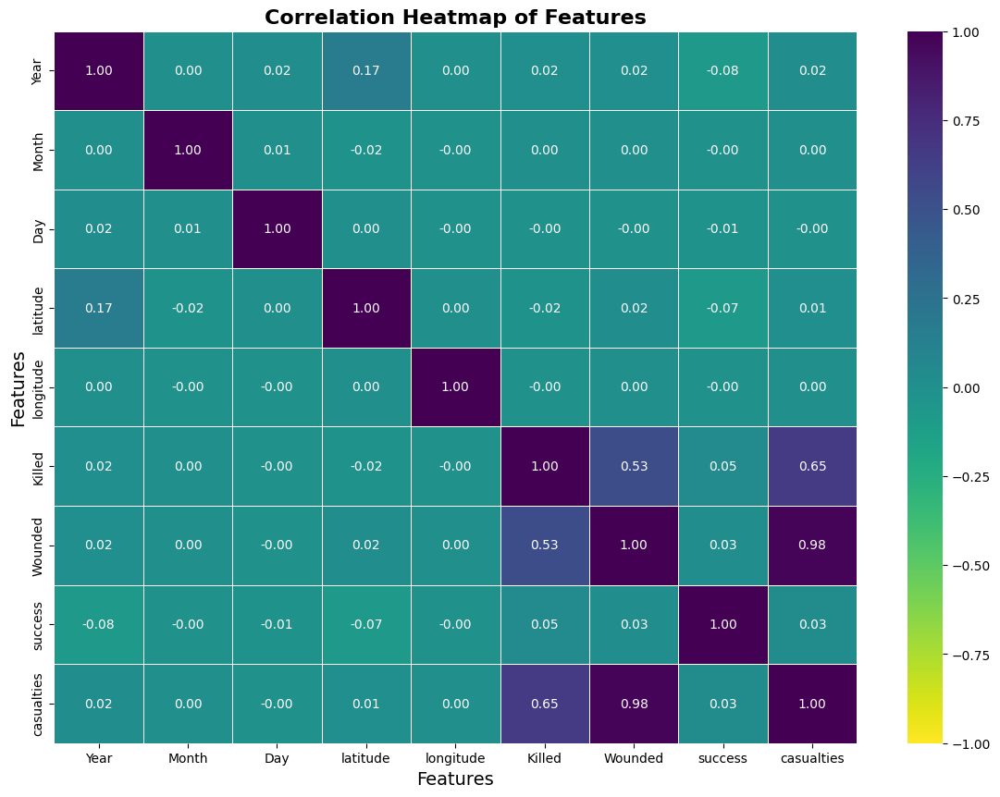

In [34]:
#Heatmap to visualize the correlation between numerical features
import pandas as pd
import seaborn as sns
import matplotlib.pyplot

correlation_matrix =  df_terr.iloc[:,1:].corr(numeric_only=True)
# correlation_matrix=num_cols.corr()
plt.style.use('default')

# Create the heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(correlation_matrix, annot=True, cmap=sns.mpl_palette("viridis_r", as_cmap=True), fmt='.2f', linewidths=0.5, vmin=-1, vmax=1)

# Add labels and title
plt.title('Correlation Heatmap of Features', fontsize=16, fontweight='bold')
plt.xlabel('Features', fontsize=14)
plt.ylabel('Features', fontsize=14)

# Show the plot
plt.show()

---
> From a glance at the diagram, it becomes clear that the extent to which the numerical features are related to each other suggests a weak correlation.
---

In [35]:
# number terrsiom attacks per year
attacks_per_year = df_terr.groupby('Year').size().reset_index(name='number of attacks per year')
attacks_per_year.T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46
Year,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
number of attacks per year,651,471,568,473,581,740,923,1319,1526,2662,2662,2586,2544,2870,3495,2915,2860,3183,3721,4324,3887,4683,5071,3456,3081,3058,3197,934,1395,1814,1906,1333,1278,1166,2017,2758,3242,4805,4721,4826,5076,8522,12036,16903,14965,13587,10900


In [36]:

# attacks_per_year.loc[attacks_per_year['number of attacks per year'].idxmax(), 'Year']

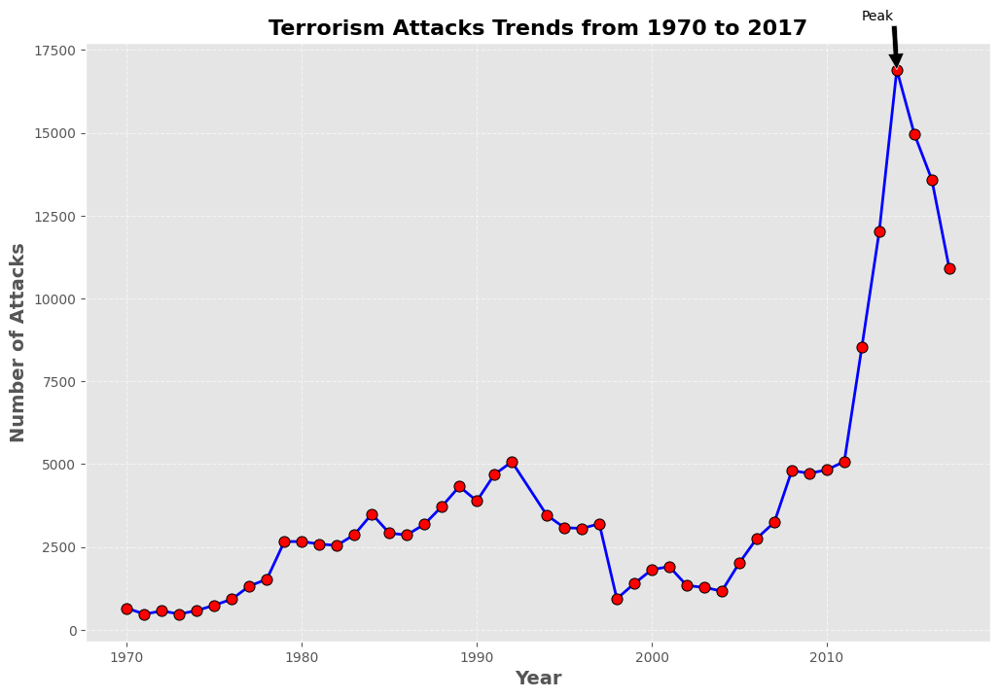

In [37]:
# sns.lineplot(x='Year', y='number of attacks per year', data=attacks_per_year, color='b',marker="o")

plt.style.use('ggplot')
plt.figure(figsize=(12, 8))

# Create the line plot
sns.lineplot(
    x='Year',y='number of attacks per year',data=attacks_per_year,color='b',marker='o',
#     linestyle=':',  # Line style
    linewidth=2, markersize=8,
    markerfacecolor='red',  # Marker fill color
    markeredgecolor='black'  # Marker edge color
)

# Add gridlines for better readability
plt.grid(True, linestyle='--', alpha=0.6)

# Add labels and title
plt.xlabel('Year', fontsize=14, fontweight='bold')
plt.ylabel('Number of Attacks', fontsize=14, fontweight='bold')
plt.title("Terrorism Attacks Trends from 1970 to 2017", fontsize=16, fontweight='bold')

# Add annotations or highlights (optional)
plt.annotate('Peak', xy=(attacks_per_year.loc[attacks_per_year['number of attacks per year'].idxmax(), 'Year'],attacks_per_year['number of attacks per year'].max()),
             xytext=(2012, attacks_per_year['number of attacks per year'].max()+1500),
             arrowprops=dict(facecolor='black'))

# Display the plot
plt.show()

## > We conclude from here that most terrorist attacks are concentrated in` 2014`. 
+ Here are the five largest attacks over the years.

In [38]:
attacks_per_year.nlargest(5,'number of attacks per year')

,Year,number of attacks per year
43,2014,16903
44,2015,14965
45,2016,13587
42,2013,12036
46,2017,10900


### Plot showing Terrorist Activities Each Year

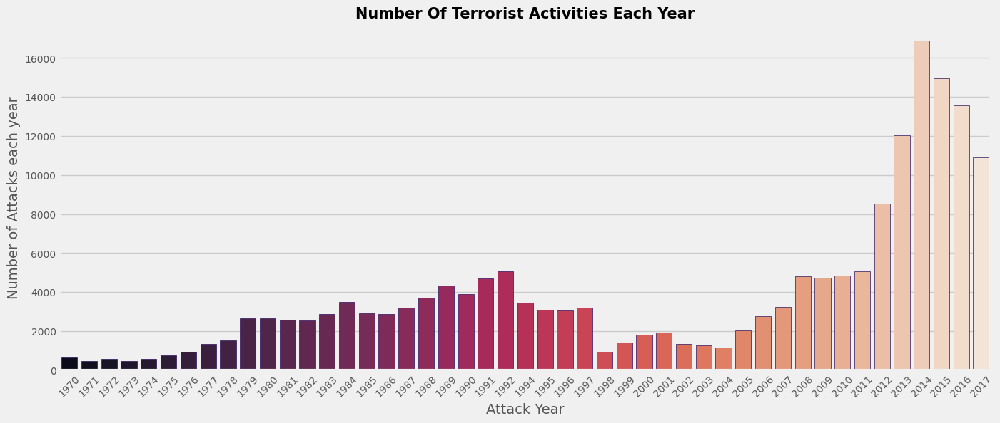

In [39]:
# Number Of Terrorist Activities Each Year
plt.style.use('fivethirtyeight')
plt.subplots(figsize=(15,6))
sns.countplot(x='Year',data=df_terr,palette='rocket',edgecolor=sns.color_palette('magma',5))


plt.xlabel('Attack Year', fontsize=14)
plt.ylabel('Number of Attacks each year', fontsize=14)
plt.xticks(rotation=45,fontsize=10)
plt.yticks(fontsize=10)

plt.title('Number Of Terrorist Activities Each Year',fontsize=15, fontweight='bold')
# plt.tight_layout()

plt.show()

---
# Total active terrorist attacks on region.

In [40]:
# numbers terrrosim attacks on region
attacks_per_region = df_terr.groupby('Region').size().reset_index(name='Total_attacks_region')
attacks_per_region.sort_values(by='Total_attacks_region',ascending=False)

,Region,Total_attacks_region
5,Middle East & North Africa,50474
8,South Asia,44974
7,South America,18978
10,Sub-Saharan Africa,17550
11,Western Europe,16639
9,Southeast Asia,12485
1,Central America & Caribbean,10344
4,Eastern Europe,5144
6,North America,3456
3,East Asia,802


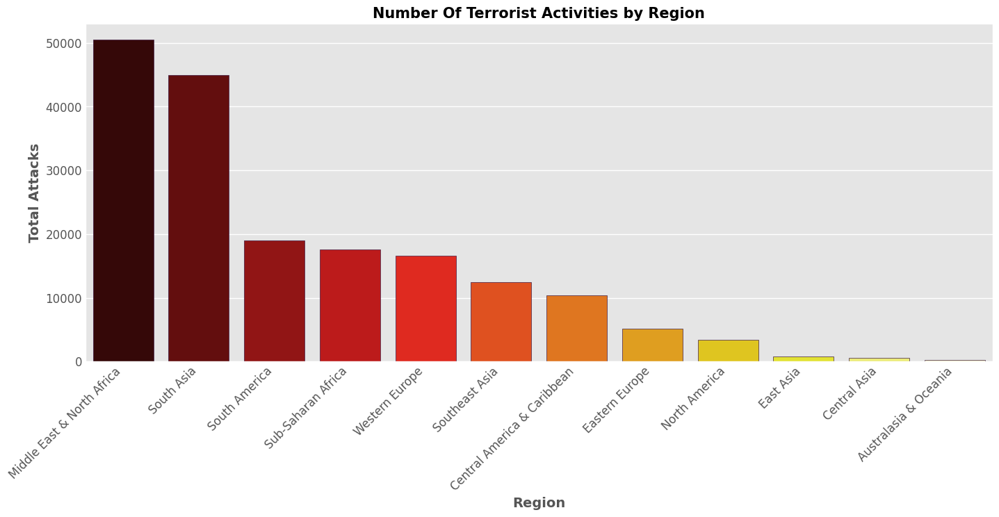

In [41]:
plt.style.use('ggplot')
plt.subplots(figsize=(15, 6))
sns.barplot(x='Region',y='Total_attacks_region' ,
            data=attacks_per_region,palette='hot',
            order=df_terr['Region'].value_counts().index,edgecolor=sns.color_palette('rocket',5))

# Customize y-axis
plt.yticks(fontsize=12)

# Add labels and title
plt.xlabel('Region', fontsize=14,fontweight='bold')
plt.ylabel('Total Attacks', fontsize=14,fontweight='bold')
plt.title('Number Of Terrorist Activities by Region', fontsize=15, fontweight='bold')

plt.xticks(rotation=45,fontsize=12,ha='right')
plt.yticks(fontsize=12)


# Adjust layout to prevent overlapping
# plt.tight_layout()

# Show the plot
plt.show()

---
+ `Middle East and North Africa` are the most terrorism prone regions followed by `South Asia`. `The Australian` Region have experienced very few terrorist events.
Collectively we can say that The African and Asian Continent experience the highest terrorist attacks.
---

## Sheet showing the number of terrorism attacks per `region` each `year`.

In [42]:
# sheet showing number terrosim attacks on region per year . 

attc_region_per_year=pd.crosstab(df_terr.Year,df_terr.Region)

attc_region_per_year['[sum_attacks on region per year]'] = attc_region_per_year.sum(axis=1)
attc_region_per_year.loc['[Total_attac_region]']= attc_region_per_year.sum()
attc_region_per_year.T

Year,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,[Total_attac_region]
Region,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Australasia & Oceania,1,1,8,1,1,0,0,0,2,2,7,3,2,0,11,7,4,3,12,29,18,10,17,14,18,19,7,6,4,6,4,2,4,0,0,2,1,8,1,1,0,0,1,9,14,10,12,282
Central America & Caribbean,7,5,3,6,11,9,45,24,199,609,1070,1148,996,858,681,780,393,566,495,503,316,729,212,180,168,116,117,1,8,14,8,3,8,5,3,5,4,0,9,1,1,1,14,5,1,3,4,10344
Central Asia,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,7,77,65,55,33,49,25,24,21,18,6,7,8,11,6,4,36,31,9,9,12,7,9,10,17,7,563
East Asia,2,1,0,2,4,12,2,4,35,16,1,4,3,13,15,10,12,10,24,18,99,29,74,34,38,89,40,9,4,19,19,4,6,4,2,1,0,25,8,1,4,4,15,43,28,8,7,802
Eastern Europe,12,5,1,1,2,0,0,2,2,1,1,4,3,2,4,5,3,1,4,16,58,84,91,95,68,175,248,105,138,234,252,112,100,46,76,70,62,209,165,261,198,173,165,962,684,134,110,5144
Middle East & North Africa,28,55,53,19,42,44,55,211,128,455,437,312,290,334,268,133,196,202,246,465,494,612,1192,1051,590,373,548,247,316,272,362,326,310,492,882,1187,1385,1536,1361,1463,1663,2409,4560,6939,6036,6115,3780,50474
North America,472,247,73,64,111,159,125,149,117,79,75,77,86,47,67,44,53,35,30,44,37,40,41,101,94,111,137,37,56,41,48,33,34,12,22,15,18,31,16,24,12,39,32,37,62,75,97,3456
South America,65,24,33,83,81,55,91,119,222,236,319,383,639,950,1492,1040,1184,1265,1041,1385,1076,1322,1204,373,255,517,774,108,134,150,229,162,117,42,49,50,47,144,159,148,106,133,182,283,176,159,172,18978
South Asia,1,0,1,1,2,4,4,2,2,34,12,23,20,63,244,161,273,348,801,926,601,677,545,376,1051,739,490,136,225,357,385,334,353,369,604,938,982,1759,1945,1981,2138,3803,4612,4998,4585,3639,3430,44974


---
Total terrorist strikes per `country`
---

In [43]:
# total terssiom attacks on country each year.
attacks_country = df_terr.Country.value_counts().to_frame().reset_index()
attacks_country.columns=['Country','total_attacks per country']
attacks_country.T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204
Country,Iraq,Pakistan,Afghanistan,India,Colombia,Philippines,Peru,El Salvador,United Kingdom,Turkey,Somalia,Nigeria,Thailand,Yemen,Spain,Sri Lanka,United States,Algeria,France,Egypt,Lebanon,Chile,Libya,West Bank and Gaza Strip,Syria,Russia,Israel,Guatemala,South Africa,Nicaragua,Ukraine,Bangladesh,Italy,Greece,Nepal,Sudan,Argentina,Democratic Republic of the Congo,Indonesia,Germany,Iran,Kenya,Burundi,Mali,Myanmar,West Germany (FRG),Mexico,Angola,Japan,Uganda,Saudi Arabia,Mozambique,Cameroon,Honduras,Bolivia,Ireland,Venezuela,Central African Republic,Brazil,Cambodia,China,South Sudan,Ecuador,Georgia,Haiti,Bahrain,Yugoslavia,Kosovo,Ethiopia,Tajikistan,Bosnia-Herzegovina,Rwanda,Niger,Belgium,Namibia,Portugal,Sweden,Cyprus,Netherlands,Panama,Senegal,Macedonia,Austria,Australia,Paraguay,Jordan,Switzerland,Tunisia,Zimbabwe,Sierra Leone,Malaysia,Canada,Chad,Dominican Republic,Papua New Guinea,Rhodesia,Uruguay,Albania,Soviet Union,Kuwait,Ivory Coast,Costa Rica,Suriname,Zambia,Tanzania,Croatia,Guadeloupe,Bulgaria,Burkina Faso,Zaire,Taiwan,Azerbaijan,Togo,Hungary,Denmark,Poland,South Korea,East Germany (GDR),Morocco,Jamaica,Republic of the Congo,Kyrgyzstan,Liberia,Macau,Czech Republic,New Caledonia,Cuba,Lesotho,Kazakhstan,Madagascar,Laos,Guyana,Hong Kong,Guinea,Armenia,Malta,Maldives,United Arab Emirates,Trinidad and Tobago,Djibouti,Uzbekistan,Moldova,Finland,New Zealand,Ghana,Norway,Mauritania,Slovak Republic,Fiji,Latvia,Swaziland,Estonia,Luxembourg,Belarus,Vietnam,Martinique,Serbia,Serbia-Montenegro,East Timor,Botswana,Eritrea,Czechoslovakia,Guinea-Bissau,Gabon,Lithuania,Benin,Belize,Qatar,Singapore,French Guiana,Romania,Bhutan,North Yemen,Slovenia,Brunei,Grenada,Bahamas,Montenegro,Western Sahara,Comoros,Malawi,People's Republic of the Congo,Iceland,Solomon Islands,Gambia,Dominica,French Polynesia,Barbados,Vanuatu,Turkmenistan,Seychelles,Mauritius,St. Kitts and Nevis,Equatorial Guinea,South Yemen,Vatican City,Falkland Islands,St. Lucia,North Korea,New Hebrides,International,Wallis and Futuna,South Vietnam,Andorra,Antigua and Barbuda
total_attacks per country,24636,14368,12731,11960,8306,6908,6096,5320,5235,4292,4142,3907,3849,3347,3249,3022,2836,2743,2693,2479,2478,2365,2249,2227,2201,2194,2183,2050,2016,1970,1709,1648,1565,1275,1215,967,815,775,761,735,684,683,613,566,546,541,524,499,402,394,371,363,332,323,314,307,293,283,273,259,252,225,220,217,213,207,203,196,190,188,159,159,154,154,151,140,132,132,130,127,118,118,115,114,114,113,111,109,101,101,99,96,91,90,89,83,82,80,78,76,74,67,66,62,59,57,56,52,52,50,50,49,48,46,41,39,38,38,36,36,36,35,34,33,32,31,30,29,27,27,27,26,26,25,24,23,22,22,22,22,21,21,20,20,19,19,18,18,17,17,16,16,16,13,12,12,12,11,10,10,10,10,9,8,8,8,8,7,7,7,6,6,6,6,6,5,5,5,5,5,5,4,4,4,3,3,3,3,2,2,2,2,2,2,2,1,1,1,1,1,1,1,1,1,1


In [44]:
# df_terr.groupby('Country').size()
# attacks_country = df_terr.groupby('Country').size().reset_index()
# attacks_country

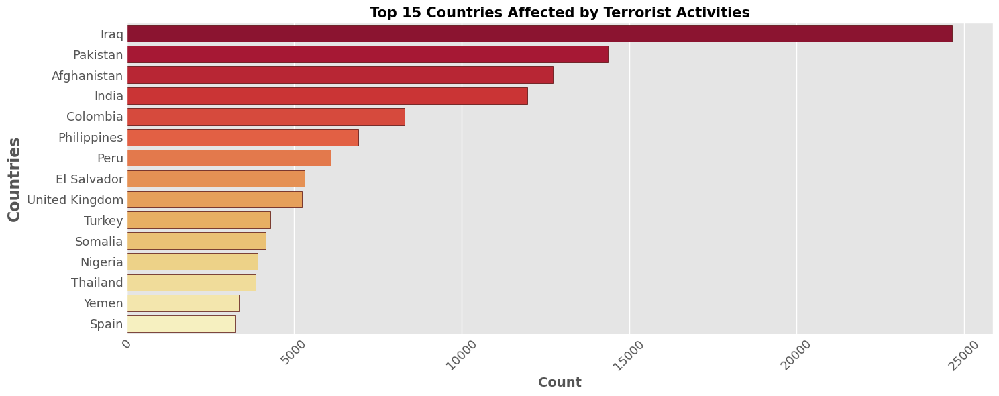

In [45]:
# plt.style.use('fivethirtyeight')
plt.style.use('ggplot')

plt.figure(figsize=(15, 6))

# Assuming `df_terr` is your DataFrame with a 'Country' column
top_countries = df_terr['Country'].value_counts().nlargest(15)
sns.barplot(y=top_countries.index, x=top_countries.values, palette='YlOrRd_r',orient="h",edgecolor=sns.color_palette('gist_heat',4))

plt.title('Top 15 Countries Affected by Terrorist Activities', fontsize=15, fontweight='bold')
plt.ylabel('Countries', fontsize=17,fontweight='semibold')
plt.xlabel('Count', fontsize=14,fontweight='semibold')

plt.xticks(rotation=45, fontsize=13)
plt.yticks(fontsize=13)

plt.tight_layout()
plt.show()


---
From the graph we can see **The Most `5 Targered` Affected Country with Terrorism Attacks** are:
1. **Iraq**
2. **Pakistan**	
3. **Afghanistan**	
4. **India**
5. **Colombia**	
* **`iraq`** has witnessed a very large number of terrorist activities followed by `Pakistan`,`Afghanistan`..etc .
One thing to note is the countries with highest attacks, are mostly densely populated countries, thus it will eventually claim  many lives.
---

## sheet showing the number of terrorism attacks per `country` each `year`.

In [46]:
attac_country_per_year = pd.crosstab(df_terr.Country,df_terr.Year)
attac_country_per_year["[sum_per_year]"] = attac_country_per_year.sum(axis=1)
attac_country_per_year.loc["[sum_attacks on country per year]"] =attac_country_per_year.sum()
attac_country_per_year.T

Country,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Australia,Austria,Azerbaijan,Bahamas,Bahrain,Bangladesh,Barbados,Belarus,Belgium,Belize,Benin,Bhutan,Bolivia,Bosnia-Herzegovina,Botswana,Brazil,Brunei,Bulgaria,Burkina Faso,Burundi,Cambodia,Cameroon,Canada,Central African Republic,Chad,Chile,China,Colombia,Comoros,Costa Rica,Croatia,Cuba,Cyprus,Czech Republic,Czechoslovakia,Democratic Republic of the Congo,Denmark,Djibouti,Dominica,Dominican Republic,East Germany (GDR),East Timor,Ecuador,Egypt,El Salvador,Equatorial Guinea,Eritrea,Estonia,Ethiopia,Falkland Islands,Fiji,Finland,France,French Guiana,French Polynesia,Gabon,Gambia,Georgia,Germany,Ghana,Greece,Grenada,Guadeloupe,Guatemala,Guinea,Guinea-Bissau,Guyana,Haiti,Honduras,Hong Kong,Hungary,Iceland,India,Indonesia,International,Iran,Iraq,Ireland,Israel,Italy,Ivory Coast,Jamaica,Japan,Jordan,Kazakhstan,Kenya,Kosovo,Kuwait,Kyrgyzstan,Laos,Latvia,Lebanon,Lesotho,Liberia,Libya,Lithuania,Luxembourg,Macau,Macedonia,Madagascar,Malawi,Malaysia,Maldives,Mali,Malta,Martinique,Mauritania,Mauritius,Mexico,Moldova,Montenegro,Morocco,Mozambique,Myanmar,Namibia,Nepal,Netherlands,New Caledonia,New Hebrides,New Zealand,Nicaragua,Niger,Nigeria,North Korea,North Yemen,Norway,Pakistan,Panama,Papua New Guinea,Paraguay,People's Republic of the Congo,Peru,Philippines,Poland,Portugal,Qatar,Republic of the Congo,Rhodesia,Romania,Russia,Rwanda,Saudi Arabia,Senegal,Serbia,Serbia-Montenegro,Seychelles,Sierra Leone,Singapore,Slovak Republic,Slovenia,Solomon Islands,Somalia,South Africa,South Korea,South Sudan,South Vietnam,South Yemen,Soviet Union,Spain,Sri Lanka,St. Kitts and Nevis,St. Lucia,Sudan,Suriname,Swaziland,Sweden,Switzerland,Syria,Taiwan,Tajikistan,Tanzania,Thailand,Togo,Trinidad and Tobago,Tunisia,Turkey,Turkmenistan,Uganda,Ukraine,United Arab Emirates,United Kingdom,United States,Uruguay,Uzbekistan,Vanuatu,Vatican City,Venezuela,Vietnam,Wallis and Futuna,West Bank and Gaza Strip,West Germany (FRG),Western Sahara,Yemen,Yugoslavia,Zaire,Zambia,Zimbabwe,[sum_attacks on country per year]
Year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1970,0,0,0,0,0,0,21,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,6,0,0,0,0,0,0,2,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,2,12,0,0,1,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,3,0,0,4,0,0,0,0,0,0,0,0,0,0,0,5,0,1,0,3,0,0,2,9,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,3,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,10,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,12,0,0,0,0,12,468,33,0,0,0,2,0,0,0,20,0,0,0,0,0,0,651
1971,0,0,0,0,0,0,7,0,1,0,0,0,0,0,0,0,0,0,0,0,2,0,0,3,0,0,0,0,2,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,3,4,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,11,0,1,1,3,0,0,0,5,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,22,0,0,0,0,0,0,2,1,0,1,0,0,0,0,0,0,35,0,0,0,0,81,247,8,0,0,0,4,0,0,0,13,0,0,0,0,1,0,471
1972,0,0,1,0,0,0,20,0,8,7,0,0,0,0,0,0,4,0,0,0,0,0,0,3,5,0,0,0,2,0,4,0,0,0,0,2,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,2,0,0,0,0,0,0,0,11,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,1,0,0,15,0,5,15,4,0,0,0,7,0,0,0,1,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,7,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,19,0,0,0,0,0,0,3,3,0,0,0,0,1,0,0,0,9,0,0,0,0,292,68,7,0,0,0,1,0,0,1,24,0,0,0,3,0,0,568
1973,1,0,0,0,0,0,60,0,0,2,0,0,0,0,0,0,1,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,7,0,6,0,0,0,0,3,0,0,0,0,0,0,3,0,0,1,0,1,0,0,0,1,0,0,0,14,0,0,0,0,0,0,0,11,0,0,0,0,0,0,1,1,0,0,0,0,0,0,4,0,3,1,15,0,0,2,1,0,0,0,0,0,0,0,11,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,6,0,0,2,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,3,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,21,0,0,0,1,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,189,58,0,0,0,0,4,0,0,0,27

---
Total Cacasualties & Killed & Wounded each Country under Region
---

In [47]:
# sheet view total cacasualties & killed & wounded each country under region
results_terr =df_terr[['Region','Country','Killed','Wounded','casualties']]
results_terr = results_terr.groupby(['Region','Country']).sum().sort_values(by='casualties',ascending=False).reset_index()
results_terr.T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204
Region,Middle East & North Africa,South Asia,South Asia,South Asia,Sub-Saharan Africa,South Asia,Middle East & North Africa,South America,North America,Southeast Asia,Middle East & North Africa,Sub-Saharan Africa,Middle East & North Africa,Central America & Caribbean,South America,Middle East & North Africa,Middle East & North Africa,Central America & Caribbean,Eastern Europe,Southeast Asia,Middle East & North Africa,Western Europe,South Asia,Middle East & North Africa,Sub-Saharan Africa,Sub-Saharan Africa,East Asia,Sub-Saharan Africa,Central America & Caribbean,Western Europe,Sub-Saharan Africa,Middle East & North Africa,Middle East & North Africa,Sub-Saharan Africa,Sub-Saharan Africa,Eastern Europe,Middle East & North Africa,Sub-Saharan Africa,Sub-Saharan Africa,Sub-Saharan Africa,South Asia,Sub-Saharan Africa,Southeast Asia,Sub-Saharan Africa,Western Europe,Sub-Saharan Africa,Sub-Saharan Africa,Southeast Asia,East Asia,Sub-Saharan Africa,Sub-Saharan Africa,Middle East & North Africa,Sub-Saharan Africa,Western Europe,North America,Central Asia,Southeast Asia,South America,Western Europe,South America,Sub-Saharan Africa,Western Europe,Middle East & North Africa,Western Europe,Central Asia,Sub-Saharan Africa,Central America & Caribbean,Sub-Saharan Africa,Western Europe,Central America & Caribbean,Sub-Saharan Africa,North America,Middle East & North Africa,South America,Eastern Europe,Central Asia,Sub-Saharan Africa,Sub-Saharan Africa,Eastern Europe,Middle East & North Africa,Sub-Saharan Africa,Sub-Saharan Africa,Middle East & North Africa,South America,Sub-Saharan Africa,Eastern Europe,Sub-Saharan Africa,Sub-Saharan Africa,Central Asia,Southeast Asia,Eastern Europe,Sub-Saharan Africa,Middle East & North Africa,Eastern Europe,Eastern Europe,Sub-Saharan Africa,Sub-Saharan Africa,South America,Australasia & Oceania,Eastern Europe,Western Europe,Western Europe,Central America & Caribbean,Western Europe,Middle East & North Africa,Western Europe,East Asia,East Asia,South Asia,Australasia & Oceania,South America,Sub-Saharan Africa,South America,Western Europe,Central America & Caribbean,Sub-Saharan Africa,Eastern Europe,Central Asia,Sub-Saharan Africa,East Asia,Western Europe,Eastern Europe,Southeast Asia,Western Europe,Western Europe,Southeast Asia,Sub-Saharan Africa,Central America & Caribbean,Central America & Caribbean,Sub-Saharan Africa,South America,Eastern Europe,Central Asia,Australasia & Oceania,Central America & Caribbean,South America,Central America & Caribbean,Eastern Europe,East Asia,Sub-Saharan Africa,Central America & Caribbean,Eastern Europe,Eastern Europe,Western Europe,Eastern Europe,Central Asia,Eastern Europe,Western Europe,Sub-Saharan Africa,Sub-Saharan Africa,Central America & Caribbean,Southeast Asia,Australasia & Oceania,Eastern Europe,Sub-Saharan Africa,Middle East & North Africa,Eastern Europe,Central America & Caribbean,Western Europe,Southeast Asia,Sub-Saharan Africa,Sub-Saharan Africa,Central America & Caribbean,South Asia,Eastern Europe,South America,Middle East & North Africa,Central America & Caribbean,Australasia & Oceania,Eastern Europe,South America,Eastern Europe,Central America & Caribbean,Sub-Saharan Africa,Sub-Saharan Africa,Eastern Europe,Sub-Saharan Africa,Southeast Asia,East Asia,Central Asia,W

In [48]:
# killed per year
k = df_terr[["Year", "Killed"]].groupby("Year").sum()
# wounded per year
w = df_terr[["Year", "Wounded"]].groupby("Year").sum()
print(w.head())
print(k.head())

      Wounded
Year         
1970    212.0
1971     82.0
1972    409.0
1973    495.0
1974    865.0
      Killed
Year        
1970   174.0
1971   173.0
1972   566.0
1973   370.0
1974   539.0


In [49]:
merged_k_w = pd.merge(w, k, on="Year")
merged_k_w.reset_index(inplace=True)
merged_k_w.head(10)

,Year,Wounded,Killed
0,1970,212.0,174.0
1,1971,82.0,173.0
2,1972,409.0,566.0
3,1973,495.0,370.0
4,1974,865.0,539.0
5,1975,617.0,617.0
6,1976,756.0,674.0
7,1977,518.0,456.0
8,1978,1600.0,1459.0
9,1979,2506.0,2100.0


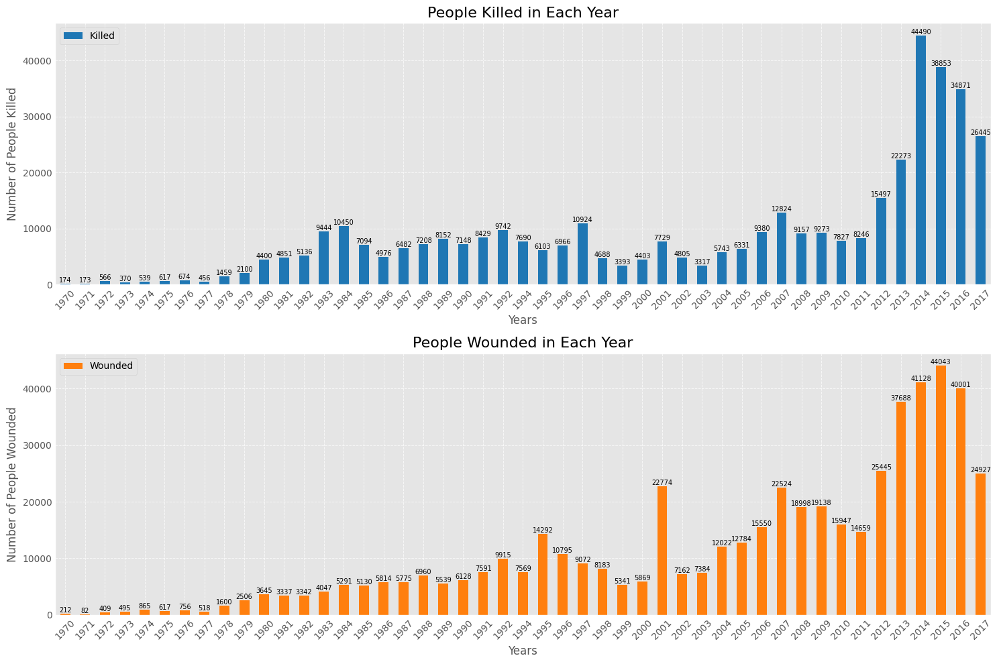

In [50]:
# Apply style
plt.style.use('ggplot')

# Create a figure and two subplots
fig, (ax0, ax1) = plt.subplots(2, 1, figsize=(15, 10))

# Plot 'Killed' data
k.plot(kind="bar", color='#1f77b4', ax=ax0, legend=True)
ax0.set_title("People Killed in Each Year", fontsize=16)
ax0.set_xlabel("Years", fontsize=12)
ax0.set_ylabel("Number of People Killed", fontsize=12)

ax0.set_xticklabels(k.index, rotation=45, fontsize=10)
ax0.grid(True, which='both', linestyle='--', linewidth=0.7, alpha=0.7)
ax0.tick_params(axis='both', which='major', labelsize=10)
ax0.legend(["Killed"], loc='upper left', bbox_to_anchor=(0, 1))

# Add data labels
for i in ax0.containers:
    ax0.bar_label(i, label_type='edge', fontsize=7)

# Plot 'Wounded' data
w.plot(kind="bar", color='#ff7f0e', ax=ax1, legend=True)
ax1.set_title("People Wounded in Each Year", fontsize=16)
ax1.set_xlabel("Years", fontsize=12)
ax1.set_ylabel("Number of People Wounded", fontsize=12)

ax1.set_xticklabels(w.index, rotation=45, fontsize=10)
ax1.grid(True, which='both', linestyle='--', linewidth=0.7, alpha=0.7)
ax1.tick_params(axis='both', which='major', labelsize=10)
ax1.legend(["Wounded"], loc='upper left', bbox_to_anchor=(0, 1))

# Add data labels
for i in ax1.containers:
    ax1.bar_label(i, label_type='edge', fontsize=7)

# Adjust layout for better visualization
plt.tight_layout()

# Show the plot
plt.show()

---
+ > Looking at these annual charts & sheet , we can say that the largest year was killing in `2014`, and then it began a gradual decline to `2017`

In [51]:
# largest 10 years people killed 
merged_k_w.nlargest(10,['Killed']).drop('Wounded',axis=1)

,Year,Killed
43,2014,44490.0
44,2015,38853.0
45,2016,34871.0
46,2017,26445.0
42,2013,22273.0
41,2012,15497.0
36,2007,12824.0
26,1997,10924.0
14,1984,10450.0
22,1992,9742.0


---
+ Regarding the wounded we can say that the largest year was killing in `2015`and then it began a gradual decline to `2017`

In [52]:
# largest 10 years people Wounded 
merged_k_w.nlargest(10,['Wounded']).drop('Killed',axis=1)

,Year,Wounded
44,2015,44043.0
43,2014,41128.0
45,2016,40001.0
42,2013,37688.0
41,2012,25445.0
46,2017,24927.0
30,2001,22774.0
36,2007,22524.0
38,2009,19138.0
37,2008,18998.0


---

+ success - Success of a terrorist strike
> * 0 : Represents failure to perform the operation.
> * 1: Represents success to perform the operation.

In [53]:
# sheet demonstrate number of terrorist attscks each countery & extent of the success and failure of these strikes and thier impact on people
# Aggregate the data
coun_stats = df_terr.groupby(['Region','Country', 'success']).agg({
    'Killed': 'sum',
    'Wounded': 'sum',
    'Country': 'count'  # Counts the number of occurrences for each (Country, success) pair
}).rename(columns={'Country': 'Num_Attacks'}).reset_index()

# Melt the DataFrame to combine 'Killed' and 'Wounded' into a single 'Types' column
coun_stats_melted = pd.melt(coun_stats, id_vars=['Region','Country', 'Num_Attacks', 'success'], value_vars=['Killed', 'Wounded'], var_name='Types', value_name='Counts_Types')

# Display the melted DataFrame
coun_stats_melted.sort_values(by=['Region', 'Country', 'Types']).reset_index(drop=True).sort_values(by='Counts_Types',ascending=False).reset_index(drop=True)


,Region,Country,Num_Attacks,success,Types,Counts_Types
0,Middle East & North Africa,Iraq,21861,1,Wounded,132572.0
1,Middle East & North Africa,Iraq,21861,1,Killed,73036.0
2,South Asia,Afghanistan,11141,1,Wounded,41643.0
3,South Asia,Pakistan,12600,1,Wounded,41132.0
4,South Asia,Afghanistan,11141,1,Killed,36552.0
5,South Asia,India,10280,1,Wounded,28373.0
6,South Asia,Pakistan,12600,1,Killed,23294.0
7,Sub-Saharan Africa,Nigeria,3593,1,Killed,22228.0
8,North America,United States,2340,1,Wounded,20634.0
9,South Asia,India,10280,1,Killed,19119.0


In [54]:
# Group by Country and Year and sum the number of killings
country_killings = df_terr.groupby(['Country','success'])[['Killed','Wounded']].sum().reset_index()

# Sort the data by the number of killings in descending order
# top_countries=country_killings.nlargest(10,'Killed')
# top_countries
country_killings

,Country,success,Killed,Wounded
0,Afghanistan,0,2832.0,2634.0
1,Afghanistan,1,36552.0,41643.0
2,Albania,0,0.0,11.0
3,Albania,1,42.0,115.0
4,Algeria,0,58.0,180.0
5,Algeria,1,11008.0,8970.0
6,Andorra,1,0.0,0.0
7,Angola,0,38.0,23.0
8,Angola,1,3005.0,2432.0
9,Antigua and Barbuda,1,0.0,0.0


In [55]:
# Group by Country and Year and sum the number of killings
country_killings = df_terr.groupby(['Country','success'])['Killed'].sum().reset_index()

# Sort the data by the number of killings in descending order
# top_countries=country_killings.nlargest(10,'Killed')
# top_countries
country_killings

,Country,success,Killed
0,Afghanistan,0,2832.0
1,Afghanistan,1,36552.0
2,Albania,0,0.0
3,Albania,1,42.0
4,Algeria,0,58.0
5,Algeria,1,11008.0
6,Andorra,1,0.0
7,Angola,0,38.0
8,Angola,1,3005.0
9,Antigua and Barbuda,1,0.0


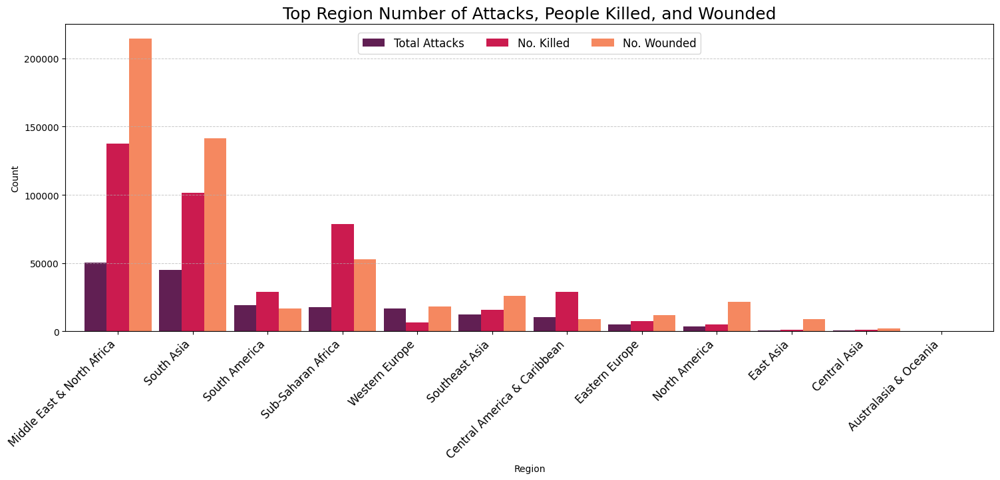

In [56]:
plt.style.use('default')
# Get the top 15 Region by number of attacks
reg_terror = df_terr['Region'].value_counts().to_frame()
reg_terror.columns = ['Attacks']

# Sum the number of people killed per Region
reg_kill = df_terr.groupby('Region')['Killed'].sum().to_frame()

# Sum the number of people wounded per Region
reg_wound = df_terr.groupby('Region')['Wounded'].sum().to_frame()

# Merge the information
reg_stats = reg_terror.merge(reg_kill, left_index=True, right_index=True, how='left')
reg_stats = reg_stats.merge(reg_wound, left_index=True, right_index=True, how='left')

# Use seaborn color palette
palette = sns.color_palette("rocket", 3)  # Choose a palette with 3 colors

# Plot the data
fig, ax = plt.subplots(figsize=(18, 6))

reg_stats.plot(kind='bar', width=0.9, ax=ax, color=palette)

ax.set_title('Top Region Number of Attacks, People Killed, and Wounded',fontsize=18)
ax.set_xlabel('Region')
ax.set_ylabel('Count')
# ax.legend( labels=['Total Attacks', 'No.Killed', 'No.Wounded'])
ax.legend(labels=['Total Attacks', 'No. Killed', 'No. Wounded'], loc='upper center', bbox_to_anchor=(0.5, .99), ncol=3, fontsize=12)


plt.xticks(rotation=45,ha='right',fontsize=12)
plt.grid(axis='y', linestyle='--', linewidth=0.7, alpha=0.7)
# plt.tight_layout()
plt.show()



---
+ >> The `Middle East and North Africa` region is considered the region most vulnerable to terrorism, followed by `South Asia`, which has a large population density, which will lead to large numbers of deaths and injuries. Although the `Australian region` has witnessed only a very small number of terrorist incidents, there have been deaths and injuries there... We can say, in one way or another, that the continents of `Africa and Asia` are witnessing the highest terrorist attacks.

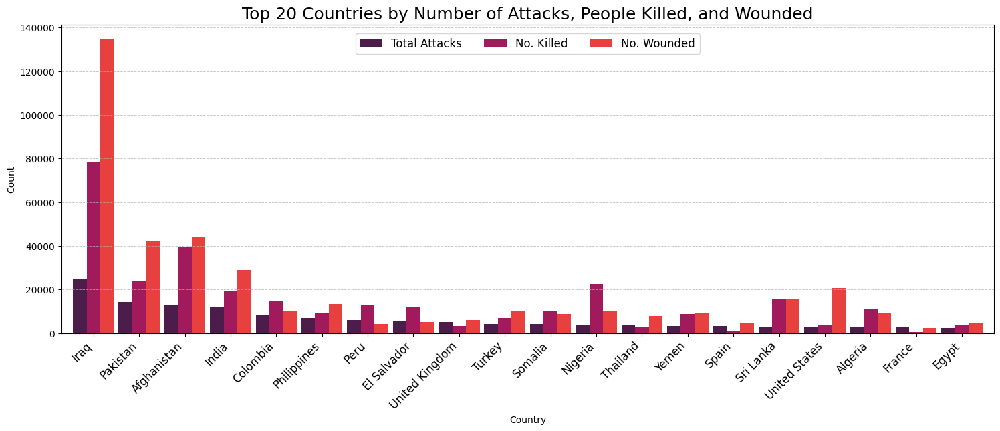

In [57]:
# Get the top 15 countries by number of attacks
coun_terror = df_terr['Country'].value_counts()[:20].to_frame()
coun_terror.columns = ['Attacks']

# Sum the number of people killed per country
coun_kill = df_terr.groupby('Country')['Killed'].sum().to_frame()

# Sum the number of people wounded per country
coun_wound = df_terr.groupby('Country')['Wounded'].sum().to_frame()

# Merge the information
coun_stats = coun_terror.merge(coun_kill, left_index=True, right_index=True, how='left')
coun_stats = coun_stats.merge(coun_wound, left_index=True, right_index=True, how='left')

# Use seaborn color palette
palette = sns.color_palette("rocket", 4)  # Choose a palette with 3 colors

# Plot the data
fig, ax = plt.subplots(figsize=(18, 6))

coun_stats.plot(kind='bar', width=0.9, ax=ax, color=palette)

ax.set_title('Top 20 Countries by Number of Attacks, People Killed, and Wounded',fontsize=18)
ax.set_xlabel('Country')
ax.set_ylabel('Count')
# ax.legend( labels=['Total Attacks', 'No.Killed', 'No.Wounded'])
ax.legend(labels=['Total Attacks', 'No. Killed', 'No. Wounded'], loc='upper center', bbox_to_anchor=(0.5, .99), ncol=3, fontsize=12)


plt.xticks(rotation=45,ha='right',fontsize=12)
plt.grid(axis='y', linestyle='--', linewidth=0.7, alpha=0.7)
# plt.tight_layout()
plt.show()



In [58]:
# its' okay
import plotly.express as px

# Group by Country and Year and sum the number of killings
country_killings = df_terr.groupby(['Country'])['Killed'].sum().reset_index()

# Sort the data by the number of killings in descending order
top_countries=country_killings.nlargest(150,'Killed')
top_countries

# Create a treemap with Plotly
fig = px.treemap(
    top_countries,
    path=['Country'],
    values='Killed',
    color='Killed',
    color_continuous_scale='Reds',
    title='Killings in Global Terrorism (Top 150 Countries)',
    labels={'Killed': 'Number of Killings'}
)

# Customize layout for better readability
fig.update_layout(
    title={
        'text': 'Killings in Global Terrorism (Top 150 Countries)',
        'font_size': 24,
        'font_family': 'Arial black',
        'x': 0.5,
        # 'y': 1,
        'xanchor': 'center'
    },
    margin=dict(t=60, l=10, r=10, b=20),
    coloraxis_colorbar=dict(
    #     title='Number of Killings',
        # tickvals=[0, top_countries['Killed'].max()],
        # ticktext=['Low', 'High'],
        # tickfont=dict(size=14, color='black', family='Arial',),
        title_font=dict(size=12, color='darkred'),
        lenmode='pixels',
    #     # len=3000
    ),
    # uniformtext=dict(minsize=12, mode='hide'),  # Adjust text size and hiding mode
    showlegend=True  # Hide legend if not needed
)

# # Customize text for better readability
fig.update_traces(
    texttemplate='%{label}<br>%{value:,}',  # Format text for better readability
    textfont=dict(size=17, color='black', family='Arial black'),  # Customize text font and color
    marker_line=dict(color='darkcyan', width=1),  # Add borders around the blocks
    hovertemplate='<b>%{label}</b><br>Number of Killings: %{value:,}<extra></extra>',  # Improve hover text
    textposition='middle center', # Place text in the middle of the blocks

)

# # Add annotations to highlight specific data points (optional)
# annotations = [
#     dict(
#         x=1, y=1,
#         text='',
#         showarrow=False,
#         font=dict(size=20, color='white')
#     )
# ]
# fig.update_layout(annotations=annotations)

# Show plot
fig.show()


---

In [59]:
import plotly.express as px
# Group by Country and Year and sum the number of killings
country_year_killings = df_terr.groupby(['Country', 'Year'])['Killed'].sum().reset_index()

# Sort the data by the number of killings in descending order
top_countries_year=country_year_killings.nlargest(50,'Killed')
top_countries_year
# Create a treemap with Plotly
fig = px.treemap(
    top_countries_year,
    path=['Country', 'Year'],
    values='Killed',
    color='Killed',
    color_continuous_scale='Reds',
    title='Killings in Global Terrorism on Years (Top 50 Years under Countries)',
    labels={'Killed': 'Number of Killings'}
)

# Customize layout for better readability
fig.update_layout(
    title={
        # 'text': title,
        'font_size': 24,
        'font_family': 'Arial Black',
        'x': 0.5,
        'xanchor': 'center'
    },
    margin=dict(t=60, l=10, r=10, b=20),
    coloraxis_colorbar=dict(
    #     title='Number of Killings',
        tickvals=[0, top_countries_year['Killed'].max()],
        ticktext=['Low', 'High'],
    #     tickfont=dict(size=14, color='black', family='Arial'),
    #     title_font=dict(size=12, color='darkred'),
    #     lenmode='pixels',
    ),
    showlegend=True
)

# Customize text for better readability
fig.update_traces(
    texttemplate='Year:%{label}<br>Number of Killings: <br>%{value:,}',  # Format text for better readability
    textfont=dict(size=17, color='black', family='Arial Black'),  # Customize text font and color
    marker_line=dict(color='darkcyan', width=1),  # Add borders around the blocks
    hovertemplate='Year:%{label}</b><br>Number of Killings: %{value:,}<extra></extra>',  # Improve hover text
    textposition='middle center',  # Place text in the middle of the blocks
)

# Add annotations to highlight specific data points (optional)
annotations = [
    dict(
        x=0.5, y=1.05,
        text=' ',
        showarrow=False,
        font=dict(size=14, color='grey'),
        xref='paper',
        yref='paper'
    )
]
fig.update_layout(annotations=annotations)

# Show plot
fig.show()


---

## The type of attack and its impact on the number of casualties killed and wounded.

In [60]:
# type of attack has an effect on the number of people killed and wounded. 
killed_wounded_attack_type = df_terr.groupby('AttackType').agg({'AttackType':'count','Killed': 'sum', 'Wounded': 'sum',}).rename(columns={'AttackType':'Num_Attacks'}).reset_index()
killed_wounded_attack_type.set_index('AttackType',inplace=True)
killed_wounded_attack_type = killed_wounded_attack_type.reset_index().sort_values(by='Num_Attacks',ascending=False)
killed_wounded_attack_type.set_index('AttackType',inplace=True)
killed_wounded_attack_type

,Num_Attacks,Killed,Wounded
AttackType,,,
Bombing/Explosion,88255,157321.0,372686.0
Armed Assault,42669,160297.0,77366.0
Assassination,19312,24920.0,13887.0
Hostage Taking (Kidnapping),11158,24231.0,6446.0
Facility/Infrastructure Attack,10356,3642.0,3765.0
Unknown,7276,32381.0,14725.0
Unarmed Assault,1015,880.0,14027.0
Hostage Taking (Barricade Incident),991,4478.0,3966.0
Hijacking,659,3718.0,17001.0


---

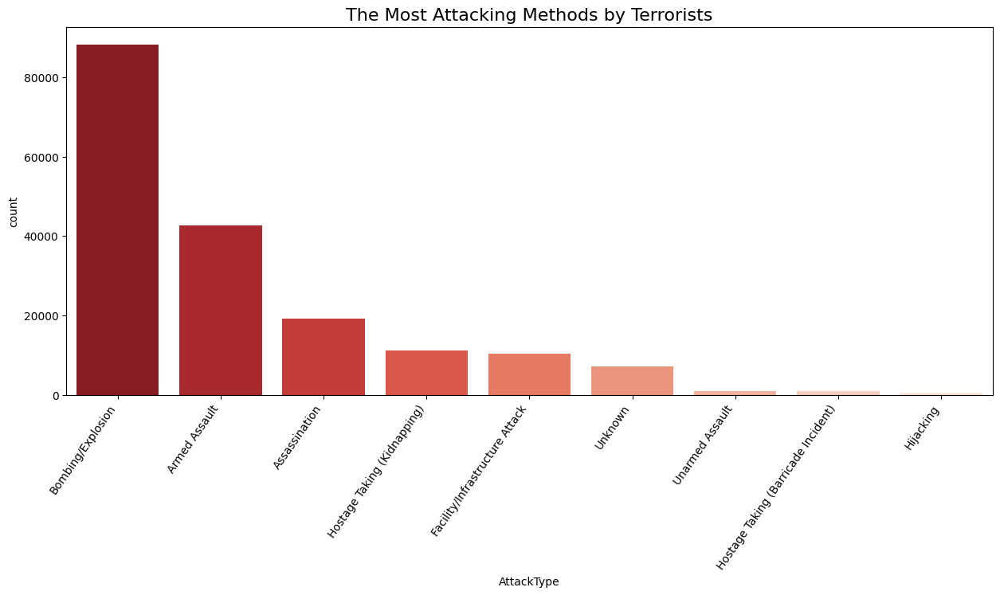

In [61]:
# Set the figure size
plt.figure(figsize=(15, 6))

# Create a count plot with Seaborn
sns.countplot(
    x='AttackType',
    data=df_terr,
    palette='Reds_r',
    order=df_terr['AttackType'].value_counts().index
)

# Rotate x-axis labels for better readability
plt.xticks(rotation=55,ha='right')

# Add a title to the plot
plt.title('The Most Attacking Methods by Terrorists', fontsize=16)

# Show the plot
# plt.tight_layout()  # Adjust layout to fit labels and title
plt.show()

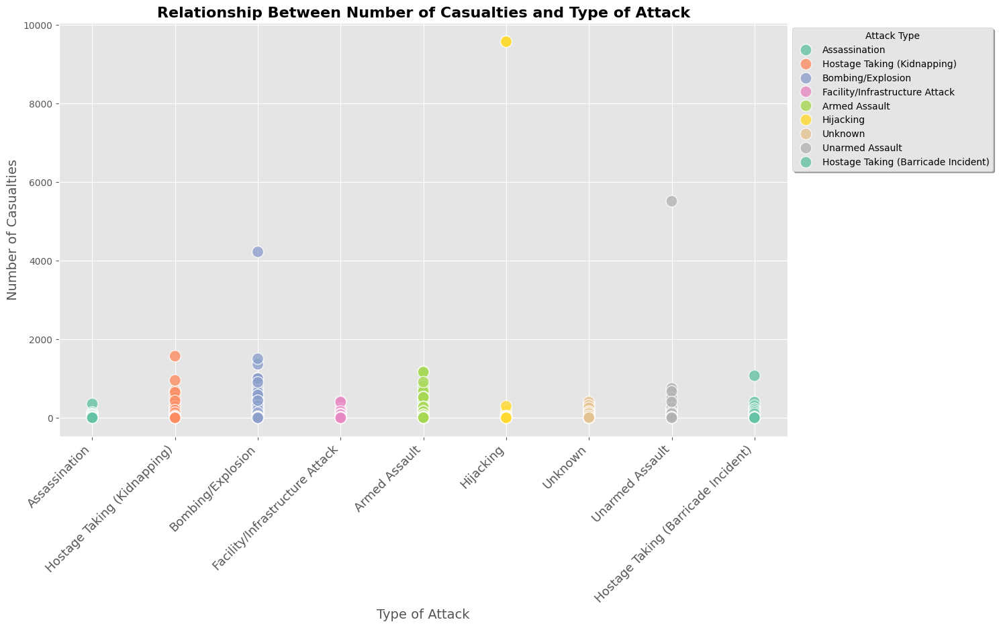

In [62]:
# df_terr['casualties'] = df_terr['Killed'].fillna(0) + df_terr['Wounded'].fillna(0)

# Set the style of the visualization
plt.style.use('ggplot')

# Create the scatter plot
plt.figure(figsize=(14, 8))
scatter_plot = sns.scatterplot(data=df_terr, x='AttackType', y='casualties', hue='AttackType', palette='Set2', s=150, alpha=0.8, edgecolor="w")

# Customize the plot
scatter_plot.set_title('Relationship Between Number of Casualties and Type of Attack', fontsize=16, fontweight='bold')
scatter_plot.set_xlabel('Type of Attack', fontsize=14)
scatter_plot.set_ylabel('Number of Casualties', fontsize=14)

plt.xticks(rotation=45, ha='right', fontsize=13)

scatter_plot.legend(title='Attack Type', loc='upper left', bbox_to_anchor=(1, 1), ncol=1, fancybox=True, shadow=True)

# Adjust x-axis labels for better readability
# scatter_plot.set_xticklabels(scatter_plot.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize=12)

# Show the plot
# plt.tight_layout()
plt.show()

---

In [63]:
killed_wounded_attack_type.index

Index(['Bombing/Explosion', 'Armed Assault', 'Assassination',
       'Hostage Taking (Kidnapping)', 'Facility/Infrastructure Attack',
       'Unknown', 'Unarmed Assault', 'Hostage Taking (Barricade Incident)',
       'Hijacking'],
      dtype='object', name='AttackType')

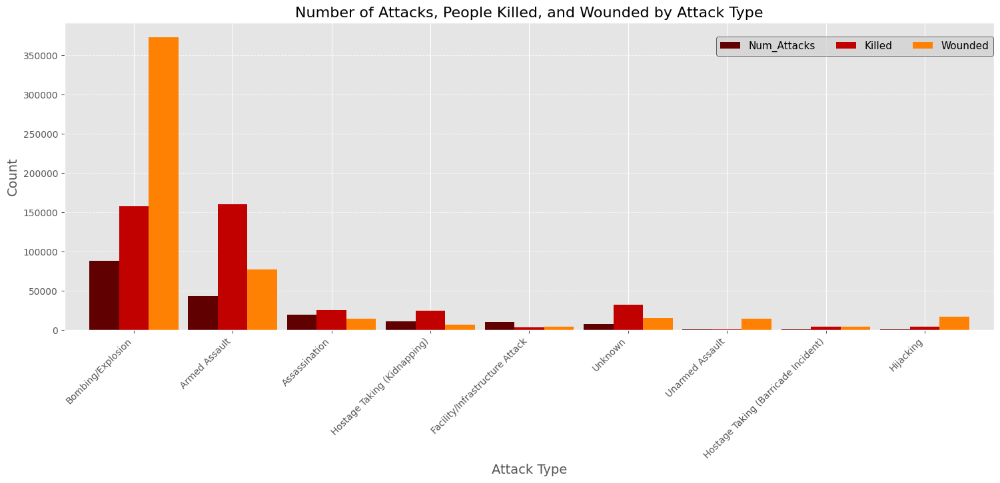

In [64]:
# Use seaborn color palette
palette = sns.color_palette("gist_heat",3 )  # Choose a palette with 3 colors

# Plot the data
fig, ax = plt.subplots(figsize=(18, 6))
killed_wounded_attack_type.plot(kind='bar', width=0.9, ax=ax, color=palette)

ax.set_title('Number of Attacks, People Killed, and Wounded by Attack Type', fontsize=16)
ax.set_xlabel('Attack Type', fontsize=14)
ax.set_ylabel('Count', fontsize=14)

# Set x-axis ticks and labels
ax.set_xticklabels(killed_wounded_attack_type.index, rotation=45, ha='right')

# Add legend
legend = ax.legend(loc='upper center', bbox_to_anchor=(0.85, .97), fontsize=11, ncol=3, frameon=True)
frame = legend.get_frame()
frame.set_facecolor('lightgrey')  # Set the background color of the legend box
frame.set_edgecolor('black')

# Add gridlines for better readability
ax.grid(axis='y', linestyle='--', linewidth=0.7, alpha=0.7)

# plt.tight_layout()
plt.show()

---
## Now let us check out which Terrorist organizations have carried out their operations in each country.

---

In [65]:
((df_terr.value_counts('Group')/len(df_terr))*100).reset_index()

,Group,count
0,Unknown,45.561971
1,Taliban,4.115779
2,Islamic State of Iraq and the Levant (ISIL),3.089311
3,Shining Path (SL),2.507004
4,Farabundo Marti National Liberation Front (FMLN),1.844340
...,...,...
3532,Jaish al-Muhajireen wal-Ansar (Muhajireen Army),0.000550
3533,Jaish al-Islam (Libya),0.000550
3534,Jaish Tahkim al-Din,0.000550
3535,Jaish Al-Umma (Army of the Nation),0.000550


---
By looking at the data and performing some mathematical procedures, we find that `unknown data` represents `45%` of the total data that we have, and we will work to solve it. 
---

In [66]:
df_terr.loc[df_terr['Group'] == 'Unknown', 'Group'] = 'Israel Security Intelligence Service (ISIS)'

In [67]:
df_terr['Group'].value_counts().to_frame()

,count
Group,
Israel Security Intelligence Service (ISIS),82782
Taliban,7478
Islamic State of Iraq and the Levant (ISIL),5613
Shining Path (SL),4555
Farabundo Marti National Liberation Front (FMLN),3351
...,...
Ansar Sarallah,1
Sword of Islam,1
Support of Ocalan-The Hawks of Thrace,1


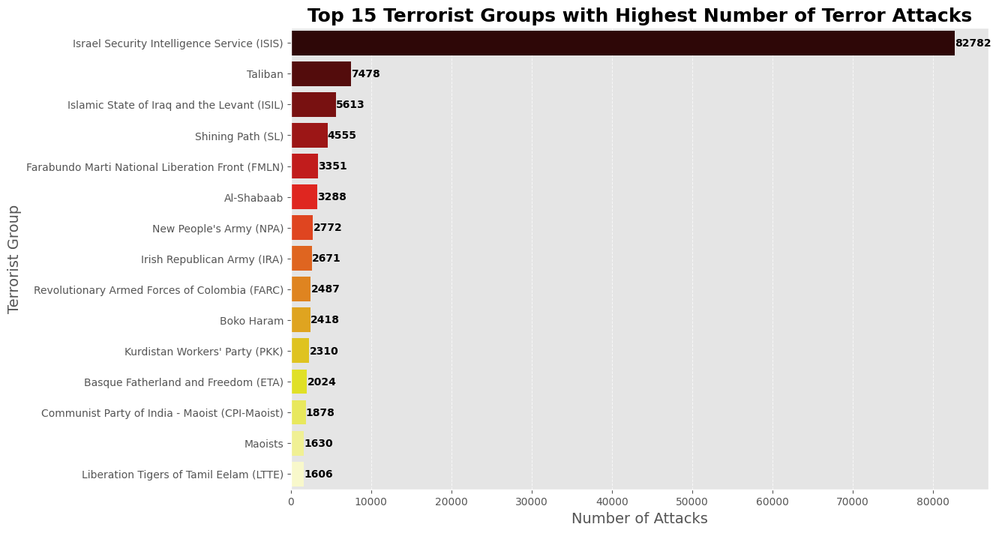

In [68]:
palette = sns.color_palette("hot",15)

# Create the plot
plt.figure(figsize=(12, 8))
bar_plot = sns.barplot(x=df_terr['Group'].value_counts()[:15].values, y=df_terr['Group'].value_counts()[:15].index, data=df_terr[:15], palette=palette)

# Enhance the plot with annotations
for p in bar_plot.patches:
    width = p.get_width()
    bar_plot.text(width + 0.5, p.get_y() + p.get_height() / 2, f'{int(width)}',
                  va='center', ha='left', fontsize=10, color='black', weight='bold')

# Set plot title and labels
plt.title('Top 15 Terrorist Groups with Highest Number of Terror Attacks', fontsize=18, weight='bold',)
plt.xlabel('Number of Attacks', fontsize=14)
plt.ylabel('Terrorist Group', fontsize=14)

# Add gridlines for better readability
plt.grid(axis='x', linestyle='--', linewidth=0.7, alpha=0.7)

# Adjust layout for better visualization
# plt.tight_layout()

# Show the plot
plt.show()

In [69]:
# If you don't have geopandas installed, uncomment the line below to install it:
# pip install geopandas

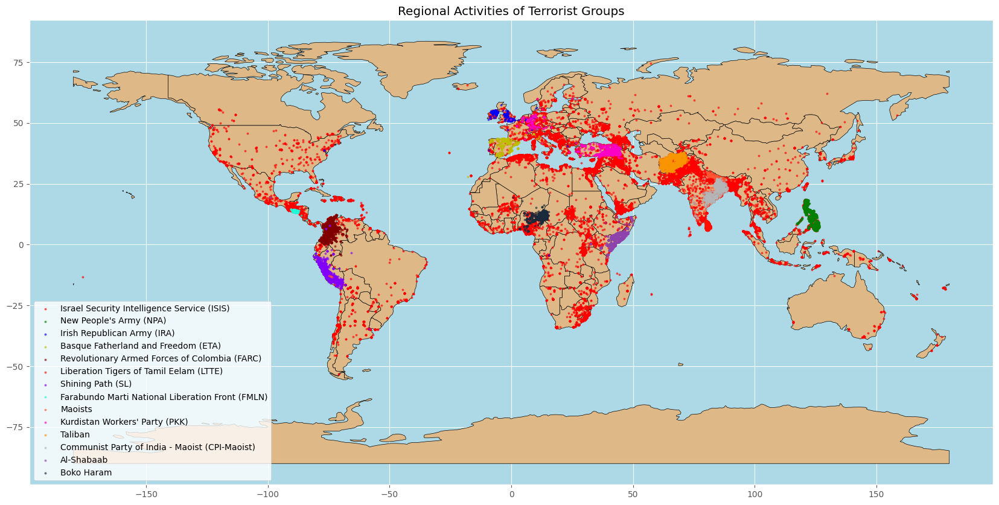

In [70]:
# its okay
import geopandas as gpd
from shapely.geometry import Point

# Ensure your df_terr DataFrame has 'longitude' and 'latitude' columns
df_terr['Coordinates'] = df_terr.apply(lambda row: Point(row['longitude'], row['latitude']), axis=1)

# Create a GeoDataFrame
gdf_terr = gpd.GeoDataFrame(df_terr, geometry='Coordinates')

# Filter top 15 groups by number of attacks
top_groups = df_terr[df_terr['Group'].isin(df_terr['Group'].value_counts()[:15].index)]

# Create a GeoDataFrame for top groups
gdf_top_groups = gpd.GeoDataFrame(top_groups, geometry='Coordinates')

# the world map shapefile ()
#-----------------------------------------------------read it its important --------------------------------------------------#

# To run it you must download it (Admin 0 – Countries) from [https://www.naturalearthdata.com/downloads/110m-cultural-vectors/ ]
# i provided it to you if u run it from jupiter 
#---can you run it from colab without using package just uncomment the line below to run it
# but comment next line ok :)
# world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

world = gpd.read_file("ne_110m_admin_0_countries\\ne_110m_admin_0_countries.shp")     
# Plot the map
fig, ax = plt.subplots(figsize=(22, 10))
ax.patch.set_facecolor('lightblue')

world.plot(ax=ax, color='burlywood', edgecolor='black')

# Define colors and groups
colors = ['r', 'g', 'b', 'y', '#800000', '#ff1100', '#8202fa', '#20fad9', '#ff5733', '#fa02c6', "#f99504", '#b3b6b7', '#8e44ad', '#1a2b3c']
groups = list(gdf_top_groups['Group'].unique())

# Plot points for each group
for group, color in zip(groups, colors):
    group_data = gdf_top_groups[gdf_top_groups['Group'] == group]
    group_data.plot(ax=ax, marker='o', color=color, markersize=5, label=group, alpha=0.6)

# Add legend
legend = plt.legend(loc='lower left', frameon=True, prop={'size': 10})
frame = legend.get_frame()
frame.set_facecolor('white')

# Set plot title
plt.title('Regional Activities of Terrorist Groups')

# Show the plot
plt.show()


In [71]:
df_terr.Target_type.head(10)

0    Private Citizens & Property
1        Government (Diplomatic)
2            Journalists & Media
3        Government (Diplomatic)
4        Government (Diplomatic)
5                         Police
6                         Police
7                      Utilities
8                       Military
9           Government (General)
Name: Target_type, dtype: object

In [72]:
(df_terr.Target_type.value_counts()/len(df_terr))*100

Target_type
Private Citizens & Property       23.947801
Military                          15.401974
Police                            13.487735
Government (General)              11.713844
Business                          11.375907
Transportation                     3.742068
Utilities                          3.314969
Unknown                            3.246171
Religious Figures/Institutions     2.443709
Educational Institution            2.378764
Government (Diplomatic)            1.966526
Terrorists/Non-State Militia       1.672620
Journalists & Media                1.622535
Violent Political Party            1.027018
Airports & Aircraft                0.739167
Telecommunication                  0.555338
NGO                                0.533873
Tourists                           0.242169
Maritime                           0.193185
Food or Water Supply               0.174472
Abortion Related                   0.144751
Other                              0.075403
Name: count, dtype: 

---
Looking at the `unknown data`, it represents a `3.24%` percentage overall data that we can ignore without effect on data.
---

In [73]:
# Filter out rows where 'Target_type' is 'Unknown'
Target_type_filter = df_terr[df_terr['Target_type'] != 'Unknown']
Target_type_filter.head(10)

,id,Year,Month,Day,Country,Region,State,city,latitude,longitude,AttackType,Killed,Wounded,Target,Summary,Group,Target_type,Weapon_type,Motive,success,casualties,Coordinates
0,197000000001,1970,7,2,Dominican Republic,Central America & Caribbean,NaN,Santo Domingo,18.456792,-69.951164,Assassination,1.0,0.0,Julio Guzman,NaN,MANO-D,Private Citizens & Property,Unknown,NaN,1,1.0,POINT (-69.951164 18.456792)
1,197000000002,1970,0,0,Mexico,North America,Federal,Mexico city,19.371887,-99.086624,Hostage Taking (Kidnapping),0.0,0.0,"Nadine Chaval, daughter",NaN,23rd of September Communist League,Government (Diplomatic),Unknown,NaN,1,0.0,POINT (-99.086624 19.371887)
2,197001000001,1970,1,0,Philippines,Southeast Asia,Tarlac,Unknown,15.478598,120.599741,Assassination,1.0,0.0,Employee,NaN,Israel Security Intelligence Service (ISIS),Journalists & Media,Unknown,NaN,1,1.0,POINT (120.599741 15.478598)
3,197001000002,1970,1,0,Greece,Western Europe,Attica,Athens,37.997490,23.762728,Bombing/Explosion,NaN,NaN,U.S. Embassy,NaN,Israel Security Intelligence Service (ISIS),Government (Diplomatic),Explosives,NaN,1,0.0,POINT (23.762728 37.99749)
4,197001000003,1970,1,0,Japan,East Asia,Fukouka,Fukouka,33.580412,130.396361,Facility/Infrastructure Attack,NaN,NaN,U.S. Consulate,NaN,Israel Security Intelligence Service (ISIS),Government (Diplomatic),Incendiary,NaN,1,0.0,POINT (130.396361 33.580412)
5,197001010002,1970,1,1,United States,North America,Illinois,Cairo,37.005105,-89.176269,Armed Assault,0.0,0.0,Cairo Police Headquarters,1/1/1970: Unknown African American assailants ...,Black Nationalists,Police,Firearms,To protest the Cairo Illinois Police Deparment,1,0.0,POINT (-89.176269 37.005105)
6,197001020001,1970,1,2,Uruguay,South America,Montevideo,Montevideo,-34.891151,-56.187214,Assassination,0.0,0.0,Juan Maria de Lucah/Chief of Directorate of in...,NaN,Tupamaros (Uruguay),Police,Firearms,NaN,0,0.0,POINT (-56.187214 -34.891151)
7,197001020002,1970,1,2,United States,North America,California,Oakland,37.791927,-122.225906,Bombing/Explosion,0.0,0.0,Edes Substation,1/2/1970: Unknown perpetrators detonated explo...,Israel Security Intelligence Service (ISIS),Utilities,Explosives,NaN,1,0.0,POINT (-122.225906 37.791927)
8,197001020003,1970,1,2,United States,North America,Wisconsin,Madison,43.076592,-89.412488,Facility/Infrastructure Attack,0.0,0.0,"R.O.T.C. offices at University of Wisconsin, M...","1/2/1970: Karl Armstrong, a member of the New ...",New Year's Gang,Military,Incendiary,To protest the War in Vietnam and the draft,1,0.0,POINT (-89.412488 43.076592)
9,197001030001,1970,1,3,United States,North America,Wisconsin,Madison,43.072950,-89.386694,Facility/Infrastructure Attack,0.0,0.0,Selective Service Headquarters in Madison Wisc...,"1/3/1970: Karl Armstrong, a member of the New ...",New Year's Gang,Government (General),Incendiary,To protest the War in Vietnam and the draft,1,0.0,POINT (-89.386694 43.07295)


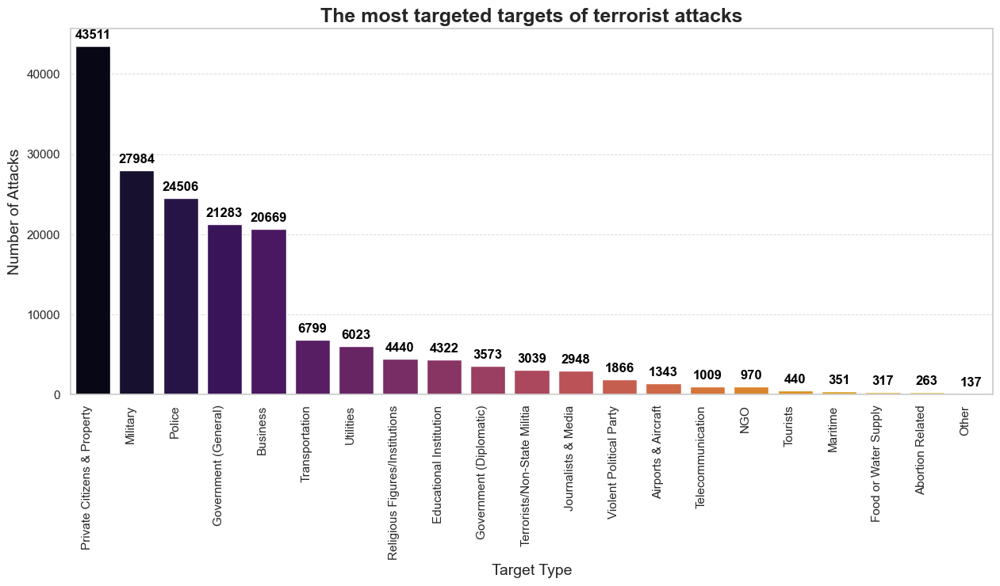

In [74]:

# Set the size and style of the plot
plt.figure(figsize=(15, 6))
sns.set(style="whitegrid")  # Set the style to 'whitegrid' for a cleaner background

# Create the countplot
ax = sns.countplot(
    x='Target_type',
    data=Target_type_filter,
    palette='inferno',
    order=Target_type_filter['Target_type'].value_counts().index
)

# Add annotations on top of the bars
for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{int(height)}',
                (p.get_x() + p.get_width() / 2., height),
                ha='center',
                va='center',
                xytext=(0, 10),
                textcoords='offset points',
                fontsize=12,
                weight='bold',
                color='black')

# Rotate x-axis labels for better readability
plt.xticks(rotation=90, ha='right')

# Set plot title and labels
plt.title('The most targeted targets of terrorist attacks', fontsize=18, weight='bold')
plt.xlabel('Target Type', fontsize=14)
plt.ylabel('Number of Attacks', fontsize=14)

# Add gridlines for y-axis
plt.grid(axis='y', linestyle='--', linewidth=0.7, alpha=0.7)

# Adjust layout for better spacing
# plt.tight_layout()

# Show the plot
plt.show()


In [75]:
# If you don't have cartopy installed, uncomment the line below to install it:
# !pip install cartopy


---
Animation shows the spread of terrorist activities in the country over the past years.
---

MovieWriter imagemagick unavailable; using Pillow instead.



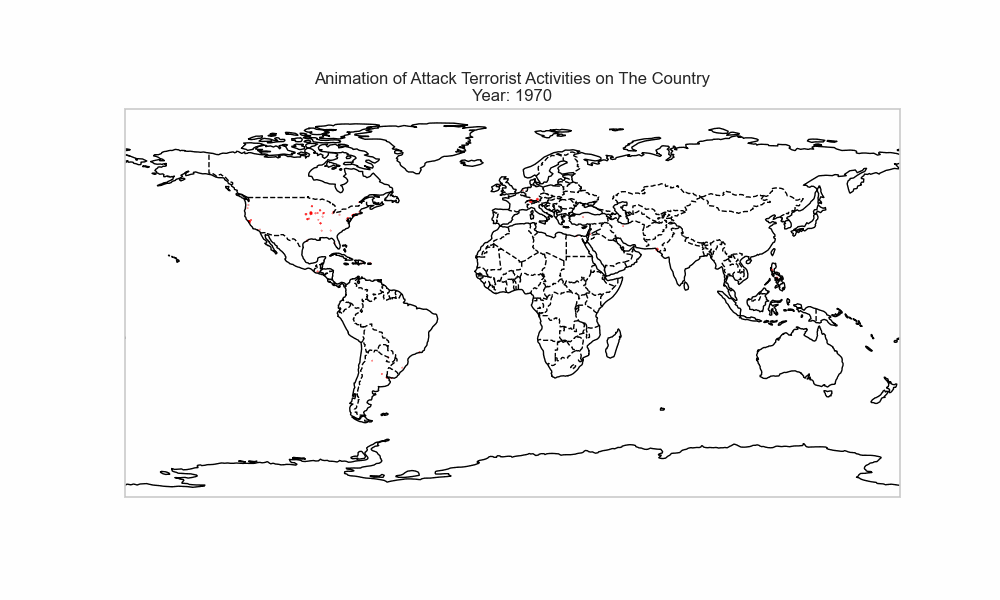

In [76]:

import matplotlib.animation as animation
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import base64
import io
from IPython.display import HTML

# Sample data creation (replace with your actual DataFrame)
# Assuming df_terr has columns 'Year', 'latitude', 'longitude', 'Killed', 'Wounded'
data = df_terr.copy()  # Create a copy to avoid modifying the original DataFrame
data['casualties'] = data['Killed'] + data['Wounded']  # Combine casualties

# Create a figure with Cartopy projection
fig, ax = plt.subplots(figsize=(10, 6), subplot_kw={'projection': ccrs.PlateCarree()})

# Add land and ocean with specified colors
ax.add_feature(cfeature.LAND, facecolor='burlywood')
ax.add_feature(cfeature.OCEAN, facecolor='lightblue')

# Initialize scatter object to None outside the function
scatter = None

def animate(year):
    global scatter  # Use global scatter object

    # Clear the axis to redraw
    ax.clear()

    # Add land and ocean with specified colors again after clearing
#     ax.add_feature(cfeature.LAND, facecolor='burlywood')
#     ax.add_feature(cfeature.OCEAN, facecolor='lightblue')
    ax.add_feature(cfeature.BORDERS, linestyle='--')
    ax.coastlines()

    # Filter data for the current year
    year_data = data[data['Year'] == year]

    # Create or update scatter plot data
    scatter = ax.scatter(
        year_data['longitude'],
        year_data['latitude'],
        s=year_data['casualties'] * 0.1,  # Adjust marker size based on casualties
        color='red',
        alpha=0.7,
        transform=ccrs.PlateCarree()  # Use PlateCarree projection
    )

    # Update title
    ax.set_title(f'Animation of Attack Terrorist Activities on The Country\nYear: {year}', fontsize=12)
    ax.set_global()

    return scatter

# Create the animation
ani = animation.FuncAnimation(fig, animate, frames=sorted(data['Year'].unique()), interval=1500)

# Save the animation as a gif
ani.save('animation.gif', writer='imagemagick', fps=1)
plt.close()

# Display the gif in a Jupyter notebook
filename = 'animation.gif'
video = io.open(filename, 'r+b').read()
encoded = base64.b64encode(video)
HTML(data=f'<img src="data:image/gif;base64,{encoded.decode("ascii")}" type="gif" />')


---

MovieWriter imagemagick unavailable; using Pillow instead.



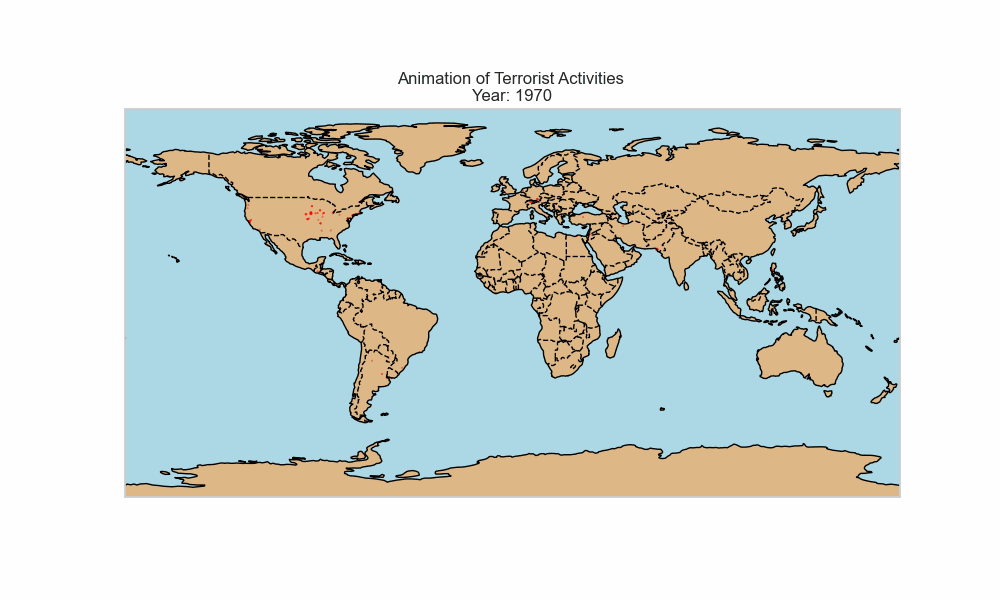

In [77]:
import matplotlib.animation as animation
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import base64
import io
from IPython.display import HTML

# Sample data creation (replace with your actual DataFrame)
# Assuming df_terr has columns 'Year', 'latitude', 'longitude', 'Killed', 'Wounded'
data = df_terr.copy()  # Create a copy to avoid modifying the original DataFrame
data['casualties'] = data['Killed'] + data['Wounded']  # Combine casualties

# Create a figure with Cartopy projection
fig, ax = plt.subplots(figsize=(10, 6), subplot_kw={'projection': ccrs.PlateCarree()})

# Add land and ocean with specified colors
ax.add_feature(cfeature.LAND, facecolor='burlywood')
ax.add_feature(cfeature.OCEAN, facecolor='lightblue')

# Initialize scatter object to None outside the function
scatter = None

def animate(year):
    global scatter  # Use global scatter object

    # Clear the axis to redraw
    ax.clear()

    # Add land and ocean with specified colors again after clearing
    ax.add_feature(cfeature.LAND, facecolor='burlywood')
    ax.add_feature(cfeature.OCEAN, facecolor='lightblue')
    ax.add_feature(cfeature.BORDERS, linestyle='--')
    ax.coastlines()

    # Filter data for the current year
    year_data = data[data['Year'] == year]

    # Create or update scatter plot data
    scatter = ax.scatter(
        year_data['longitude'],
        year_data['latitude'],
        s=year_data['casualties'] * 0.1,  # Adjust marker size based on casualties
        color='red',
        alpha=0.7,
        transform=ccrs.PlateCarree()  # Use PlateCarree projection
    )

    # Update title
    ax.set_title(f'Animation of Terrorist Activities each Country \nYear: {year}', fontsize=12)
    ax.set_global()

    return scatter

# Create the animation
ani = animation.FuncAnimation(fig, animate, frames=sorted(data['Year'].unique()), interval=1500)

# Save the animation as a gif
ani.save('animation.gif', writer='imagemagick', fps=1)
plt.close()

# Display the gif in a Jupyter notebook
filename = 'animation.gif'
video = io.open(filename, 'r+b').read()
encoded = base64.b64encode(video)
HTML(data=f'<img src="data:image/gif;base64,{encoded.decode("ascii")}" type="gif" />')


# Distribution showing the total terrorist attacks by country during the past years and the most affected countries.

In [78]:
import plotly.express as px

# Group the data by country and count the number of attacks
country_counts = df_terr['Country'].value_counts().reset_index()
country_counts.columns = ['Country', 'Attack Count']

# Create the choropleth map
fig = px.choropleth(
    country_counts,
    locations='Country',
    locationmode='country names',
    color='Attack Count',
    title='Distrbution Terrorist Attacks by Country',
    labels={'Attack Count': 'Number of Attacks'},
    hover_name='Country',
    color_continuous_scale='YlOrRd'
)

# Customize the color scale
fig.update_layout(
    title=dict(
        text='Distrbution Terrorist Attacks by Country Over The Past Years',
        font=dict(size=24, family='Arial', color='black'),
        x=0.5,
        xanchor='center'
    ),
    geo=dict(
      showframe=False,
        showcoastlines=True,
        projection_type='equirectangular',
        # center=dict(lat=0, lon=0),  # Center the map on a specific latitude and longitude
        # projection_scale=5,
    ),
    coloraxis_colorbar=dict(
        title='Number of Attacks',
        ticks='outside',
        ticklen=5,
        tickcolor='black',
        showticksuffix='all'
    ),
      # paper_bgcolor='lightgrey'  # Change the background color of the entire figure
    # plot_bgcolor='black'   # Change the background color of the plot area
     width=1000,  # Width of the figure in pixels
    height=600  # Height of the figure in pixels
)

# Add a hover template
fig.update_traces(
    hovertemplate='<b>%{hovertext}</b><br>Number of Attacks: %{z}<extra></extra>'
)

fig.show()


---

# --------------------> Performance Comparison with Dask <--------------------------

+ Demonstrate how to use Dask to perform similar operations with large datasets.
+  Compare the performance and memory usage of Dask operations with Pandas.

In [79]:
import dask.dataframe as dd
import time
#dask
dtype={'approxdate': 'object',
       'attacktype2_txt': 'object',
       'attacktype3_txt': 'object',
       'claimmode2_txt': 'object',
       'claimmode3_txt': 'object',
       'corp2': 'object',
       'corp3': 'object',
       'divert': 'object',
       'doubtterr': 'float64',
       'gname2': 'object',
       'gname3': 'object',
       'gsubname': 'object',
       'gsubname2': 'object',
       'gsubname3': 'object',
       'hostkidoutcome_txt': 'object',
       'multiple': 'float64',
       'natlty1': 'float64',
       'natlty2_txt': 'object',
       'natlty3_txt': 'object',
       'ransom': 'float64',
       'ransomnote': 'object',
       'related': 'object',
       'target2': 'object',
       'target3': 'object',
       'targsubtype1': 'float64',
       'targsubtype2_txt': 'object',
       'targsubtype3_txt': 'object',
       'targtype2_txt': 'object',
       'targtype3_txt': 'object',
       'weapsubtype2_txt': 'object',
       'weapsubtype3_txt': 'object',
       'weaptype2_txt': 'object',
       'weaptype3_txt': 'object',
       'guncertain1': 'float64',
       'ishostkid': 'float64',
       'resolution': 'object',
       'specificity': 'float64',
       'weapsubtype4_txt': 'object',
       'weaptype4_txt': 'object'}
start_time = time.time()
df_dd = dd.read_csv('globalterrorismdb_0718dist.csv', encoding='ISO-8859-1', low_memory=True,dtype=dtype)
# low_memory=True // helps manage memory usage by processing files in chunks and is useful for very large datasets but may lead to less accurate type inference.

dask_duration = time.time() - start_time

print(f"Time taken to read CSV into Dask DataFrame: {dask_duration:.2f} seconds")


Time taken to read CSV into Dask DataFrame: 0.61 seconds


In [80]:
# [persist()] This method computes the DataFrame and caches it in memory, which can speed up subsequent operations.
df_dd = df_dd.persist()   # Persist the DataFrame memory to cache it

df_dd = df_dd.compute()  # Compute the DataFrame on the cluster
df_dd.head()

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,region_txt,provstate,city,latitude,longitude,specificity,vicinity,location,summary,crit1,crit2,crit3,doubtterr,alternative,alternative_txt,multiple,success,suicide,attacktype1,attacktype1_txt,attacktype2,attacktype2_txt,attacktype3,attacktype3_txt,targtype1,targtype1_txt,targsubtype1,targsubtype1_txt,corp1,target1,natlty1,natlty1_txt,targtype2,targtype2_txt,targsubtype2,targsubtype2_txt,corp2,target2,natlty2,natlty2_txt,targtype3,targtype3_txt,targsubtype3,targsubtype3_txt,corp3,target3,natlty3,natlty3_txt,gname,gsubname,gname2,gsubname2,gname3,gsubname3,motive,guncertain1,guncertain2,guncertain3,individual,nperps,nperpcap,claimed,claimmode,claimmode_txt,claim2,claimmode2,claimmode2_txt,claim3,claimmode3,claimmode3_txt,compclaim,weaptype1,weaptype1_txt,weapsubtype1,weapsubtype1_txt,weaptype2,weaptype2_txt,weapsubtype2,weapsubtype2_txt,weaptype3,weaptype3_txt,weapsubtype3,weapsubtype3_txt,weaptype4,weaptype4_txt,weapsubtype4,weapsubtype4_txt,weapdetail,nkill,nkillus,nkillter,nwound,nwoundus,nwoundte,property,propextent,propextent_txt,propvalue,propcomment,ishostkid,nhostkid,nhostkidus,nhours,ndays,divert,kidhijcountry,ransom,ransomamt,ransomamtus,ransompaid,ransompaidus,ransomnote,hostkidoutcome,hostkidoutcome_txt,nreleased,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,197000000001,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,Central America & Caribbean,NaN,Santo Domingo,18.456792,-69.951164,1.0,0,NaN,NaN,1,1,1,0.0,NaN,NaN,0.0,1,0,1,Assassination,NaN,NaN,NaN,NaN,14,Private Citizens & Property,68.0,Named Civilian,NaN,Julio Guzman,58.0,Dominican Republic,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,MANO-D,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,1,North America,Federal,Mexico city,19.371887,-99.086624,1.0,0,NaN,NaN,1,1,1,0.0,NaN,NaN,0.0,1,0,6,Hostage Taking (Kidnapping),NaN,NaN,NaN,NaN,7,Government (Diplomatic),45.0,"Diplomatic Personnel (outside of embassy, cons...",Belgian Ambassador Daughter,"Nadine Chaval, daughter",21.0,Belgium,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23rd of September Communist League,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0,7.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,1.0,1.0,0.0,NaN,NaN,NaN,Mexico,1.0,800000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,197001000001,1970,1,0,NaN,0,NaN,160,Philippines,5,Southeast Asia,Tarlac,Unknown,15.478598,120.599741,4.0,0,NaN,NaN,1,1,1,0.0,NaN,NaN,0.0,1,0,1,Assassination,NaN,NaN,NaN,NaN,10,Journalists & Media,54.0,Radio Journalist/Staff/Facility,Voice of America,Employee,217.0,United States,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
3,197001000002,1970,1,0,NaN,0,NaN,78,Greece,8,Western Europe,Attica,Athens,37.997490,23.762728,1.0,0,NaN,NaN,1,1,1,0.0,NaN,NaN,0.0,1,0,3,Bombing/Explosion,NaN,NaN,NaN,NaN,7,Government (Diplomatic),46.0,Embassy/Consulate,NaN,U.S. Embassy,217.0,United States,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6,Explosives,16.0,Unknown Explosive Type,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Explosive,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN

In [81]:
df_dd.describe()

,eventid,iyear,imonth,iday,extended,country,region,latitude,longitude,specificity,vicinity,crit1,crit2,crit3,doubtterr,alternative,multiple,success,suicide,attacktype1,attacktype2,attacktype3,targtype1,targsubtype1,natlty1,targtype2,targsubtype2,natlty2,targtype3,targsubtype3,natlty3,guncertain1,guncertain2,guncertain3,individual,nperps,nperpcap,claimed,claimmode,claim2,claimmode2,claim3,claimmode3,compclaim,weaptype1,weapsubtype1,weaptype2,weapsubtype2,weaptype3,weapsubtype3,weaptype4,weapsubtype4,nkill,nkillus,nkillter,nwound,nwoundus,nwoundte,property,propextent,propvalue,ishostkid,nhostkid,nhostkidus,nhours,ndays,ransom,ransomamt,ransomamtus,ransompaid,ransompaidus,hostkidoutcome,nreleased,INT_LOG,INT_IDEO,INT_MISC,INT_ANY
count,1.816910e+05,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,177135.000000,1.771340e+05,181685.000000,181691.000000,181691.000000,181691.000000,181691.000000,181690.000000,29011.000000,181690.000000,181691.000000,181691.000000,181691.000000,6314.000000,428.000000,181691.000000,171318.000000,180132.000000,11144.000000,10685.000000,10828.000000,1176.000000,1097.000000,1147.000000,181311.000000,1955.000000,320.000000,181691.000000,110576.000000,112202.000000,115571.000000,19083.000000,1890.000000,616.000000,318.000000,133.000000,4839.000000,181691.000000,160923.000000,13127.000000,11542.000000,1863.000000,1693.000000,73.000000,70.000000,171378.000000,117245.000000,114733.000000,165380.000000,116989.000000,112548.000000,181691.000000,64065.000000,3.898900e+04,181513.000000,13572.000000,13517.000000,4063.000000,8124.000000,77381.000000,1.350000e+03,5.630000e+02,7.740000e+02,552.000000,10991.000000,10400.000000,181691.000000,181691.000000,181691.000000,181691.000000
mean,2.002705e+11,2002.638997,6.467277,15.505644,0.045346,131.968501,7.160938,23.498343,-4.586957e+02,1.451452,0.068297,0.988530,0.993093,0.875668,-0.523171,1.292923,0.137773,0.889598,0.036507,3.247547,3.719512,5.245327,8.439719,46.971474,127.686441,10.247218,55.311652,131.179442,10.021259,55.548769,144.564952,0.081440,0.265473,0.193750,0.002950,-65.361154,-1.517727,0.049666,7.022848,0.247619,7.176948,0.411950,6.729323,-6.296342,6.447325,11.117162,6.812524,10.754029,6.911433,11.643237,6.246575,10.842857,2.403272,0.045981,0.508058,3.167668,0.038944,0.107163,-0.544556,3.295403,2.088119e+05,0.059054,4.533230,-0.353999,-46.793933,-32.516371,-0.145811,3.172530e+06,5.784865e+05,7.179437e+05,240.378623,4.629242,-29.018269,-4.543731,-4.464398,0.090010,-3.945952
std,1.325957e+09,13.259430,3.388303,8.814045,0.208063,112.414535,2.933408,18.569242,2.047790e+05,0.995430,0.284553,0.106483,0.082823,0.329961,2.455819,0.703729,0.344663,0.313391,0.187549,1.915772,2.272023,2.246642,6.653838,30.953357,89.299120,5.709076,25.640310,125.951485,5.723447,26.288955,163.299295,0.273511,0.441698,0.395854,0.054234,216.536633,12.830346,1.093195,2.476851,0.974018,2.783725,0.492962,2.908003,4.234620,2.173435,6.495612,2.277081,7.594574,2.177956,8.493166,1.507212,8.192672,11.545741,5.681854,4.199937,35.949392,3.057361,1.488881,3.122889,0.486912,1.552463e+07,0.461244,202.316386,6.835645,82.800405,121.209205,1.207861,3.021157e+07,7.077924e+06,1.014392e+07,2940.967293,2.035360,65.720119,4.543547,4.637152,0.568457,4.691325
min,1.970000e+11,1970.000000,0.000000,0.000000,0.000000,4.000000,1.000000,-53.154613,-8.618590e+07,1.000000,-9.000000,0.000000,0.000000,0.000000,-9.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,4.000000,1.000000,1.000000,4.000000,1.000000,1.000000,4.000000,0.000000,0.000000,0.000000,0.000000,-99.000000,-99.000000,-9.000000,1.000000,-9.000000,1.000000,0.000000,1.000000,-9.000000,1.000000,1.000000,1.000000,1.000000,2.000000,1.000000,5.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-9.000000,1.000000,-9.900000e+01,-9.000000,-99.000000,-99.000000,-99.000000,-99.000000,-9.000000,-9.900000e+01,-9.900000e+01,-9.900000e+01,-99.000000,1.000000,-99.000000,-9.000000,-9.000

In [82]:
df_dd.info()

<class 'pandas.core.frame.DataFrame'>
Index: 181691 entries, 0 to 74206
Columns: 135 entries, eventid to related
dtypes: float64(55), int64(22), object(58)
memory usage: 188.5+ MB


In [83]:
df_dd

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,region_txt,provstate,city,latitude,longitude,specificity,vicinity,location,summary,crit1,crit2,crit3,doubtterr,alternative,alternative_txt,multiple,success,suicide,attacktype1,attacktype1_txt,attacktype2,attacktype2_txt,attacktype3,attacktype3_txt,targtype1,targtype1_txt,targsubtype1,targsubtype1_txt,corp1,target1,natlty1,natlty1_txt,targtype2,targtype2_txt,targsubtype2,targsubtype2_txt,corp2,target2,natlty2,natlty2_txt,targtype3,targtype3_txt,targsubtype3,targsubtype3_txt,corp3,target3,natlty3,natlty3_txt,gname,gsubname,gname2,gsubname2,gname3,gsubname3,motive,guncertain1,guncertain2,guncertain3,individual,nperps,nperpcap,claimed,claimmode,claimmode_txt,claim2,claimmode2,claimmode2_txt,claim3,claimmode3,claimmode3_txt,compclaim,weaptype1,weaptype1_txt,weapsubtype1,weapsubtype1_txt,weaptype2,weaptype2_txt,weapsubtype2,weapsubtype2_txt,weaptype3,weaptype3_txt,weapsubtype3,weapsubtype3_txt,weaptype4,weaptype4_txt,weapsubtype4,weapsubtype4_txt,weapdetail,nkill,nkillus,nkillter,nwound,nwoundus,nwoundte,property,propextent,propextent_txt,propvalue,propcomment,ishostkid,nhostkid,nhostkidus,nhours,ndays,divert,kidhijcountry,ransom,ransomamt,ransomamtus,ransompaid,ransompaidus,ransomnote,hostkidoutcome,hostkidoutcome_txt,nreleased,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,197000000001,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,Central America & Caribbean,NaN,Santo Domingo,18.456792,-69.951164,1.0,0,NaN,NaN,1,1,1,0.0,NaN,NaN,0.0,1,0,1,Assassination,NaN,NaN,NaN,NaN,14,Private Citizens & Property,68.0,Named Civilian,NaN,Julio Guzman,58.0,Dominican Republic,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,MANO-D,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,1,North America,Federal,Mexico city,19.371887,-99.086624,1.0,0,NaN,NaN,1,1,1,0.0,NaN,NaN,0.0,1,0,6,Hostage Taking (Kidnapping),NaN,NaN,NaN,NaN,7,Government (Diplomatic),45.0,"Diplomatic Personnel (outside of embassy, cons...",Belgian Ambassador Daughter,"Nadine Chaval, daughter",21.0,Belgium,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23rd of September Communist League,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0,7.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,1.0,1.0,0.0,NaN,NaN,NaN,Mexico,1.0,800000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,197001000001,1970,1,0,NaN,0,NaN,160,Philippines,5,Southeast Asia,Tarlac,Unknown,15.478598,120.599741,4.0,0,NaN,NaN,1,1,1,0.0,NaN,NaN,0.0,1,0,1,Assassination,NaN,NaN,NaN,NaN,10,Journalists & Media,54.0,Radio Journalist/Staff/Facility,Voice of America,Employee,217.0,United States,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
3,197001000002,1970,1,0,NaN,0,NaN,78,Greece,8,Western Europe,Attica,Athens,37.997490,23.762728,1.0,0,NaN,NaN,1,1,1,0.0,NaN,NaN,0.0,1,0,3,Bombing/Explosion,NaN,NaN,NaN,NaN,7,Government (Diplomatic),46.0,Embassy/Consulate,NaN,U.S. Embassy,217.0,United States,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6,Explosives,16.0,Unknown Explosive Type,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Explosive,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN

In [84]:
df_dd["country_txt"].value_counts()

country_txt
Iraq                                24636
Pakistan                            14368
Afghanistan                         12731
India                               11960
Colombia                             8306
Philippines                          6908
Peru                                 6096
El Salvador                          5320
United Kingdom                       5235
Turkey                               4292
Somalia                              4142
Nigeria                              3907
Thailand                             3849
Yemen                                3347
Spain                                3249
Sri Lanka                            3022
United States                        2836
Algeria                              2743
France                               2693
Egypt                                2479
Lebanon                              2478
Chile                                2365
Libya                                2249
West Bank and Gaza Str

In [85]:
df_dd.groupby("country_txt").count().sort_values(by="nkill",ascending=False)

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,region,region_txt,provstate,city,latitude,longitude,specificity,vicinity,location,summary,crit1,crit2,crit3,doubtterr,alternative,alternative_txt,multiple,success,suicide,attacktype1,attacktype1_txt,attacktype2,attacktype2_txt,attacktype3,attacktype3_txt,targtype1,targtype1_txt,targsubtype1,targsubtype1_txt,corp1,target1,natlty1,natlty1_txt,targtype2,targtype2_txt,targsubtype2,targsubtype2_txt,corp2,target2,natlty2,natlty2_txt,targtype3,targtype3_txt,targsubtype3,targsubtype3_txt,corp3,target3,natlty3,natlty3_txt,gname,gsubname,gname2,gsubname2,gname3,gsubname3,motive,guncertain1,guncertain2,guncertain3,individual,nperps,nperpcap,claimed,claimmode,claimmode_txt,claim2,claimmode2,claimmode2_txt,claim3,claimmode3,claimmode3_txt,compclaim,weaptype1,weaptype1_txt,weapsubtype1,weapsubtype1_txt,weaptype2,weaptype2_txt,weapsubtype2,weapsubtype2_txt,weaptype3,weaptype3_txt,weapsubtype3,weapsubtype3_txt,weaptype4,weaptype4_txt,weapsubtype4,weapsubtype4_txt,weapdetail,nkill,nkillus,nkillter,nwound,nwoundus,nwoundte,property,propextent,propextent_txt,propvalue,propcomment,ishostkid,nhostkid,nhostkidus,nhours,ndays,divert,kidhijcountry,ransom,ransomamt,ransomamtus,ransompaid,ransompaidus,ransomnote,hostkidoutcome,hostkidoutcome_txt,nreleased,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
country_txt,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Iraq,24636,24636,24636,24636,4558,24636,83,24636,24636,24636,24636,24620,24487,24487,24636,24636,14085,24494,24636,24636,24636,24636,2922,2922,24636,24636,24636,24636,24636,498,498,23,23,24636,24636,22953,22953,22090,24592,24607,24607,1925,1925,1881,1881,1847,1914,1869,1869,165,165,156,156,155,166,161,161,24636,553,98,11,4,0,9487,24635,97,4,24636,21923,23753,24494,2649,2649,99,17,17,4,2,2,586,24636,24636,23387,23387,961,961,743,743,133,133,114,114,0,0,0,0,11203,23911,24323,23925,23370,24253,23658,24636,8969,8969,5234,12182,24636,1025,1020,282,756,18,60,1209,29,20,20,20,23,1017,1017,978,5014,24487,14118,7080,24636,24636,24636,24636,24636,3772
Pakistan,14368,14368,14368,14368,356,14368,107,14368,14368,14368,14368,14357,14318,14318,14367,14368,6835,12627,14368,14368,14368,14368,1824,1824,14368,14368,14368,14368,14368,440,440,28,28,14368,14368,13309,13309,12227,14348,14305,14305,793,793,767,767,700,788,771,771,55,55,55,55,49,57,56,56,14368,305,194,18,26,2,5060,14368,190,26,14368,12127,12487,12627,2029,2029,190,105,105,26,11,11,289,14368,14368,13421,13421,775,775,751,751,126,126,122,122,1,1,2,2,8114,14119,12642,12593,13899,12633,12488,14368,6126,6126,3823,6807,14368,899,897,172,695,15,81,2646,54,37,38,36,36,845,845,828,2459,12621,9038,5286,14368,14368,14368,14368,14368,1390
Afghanistan,12731,12731,12731,12731,1099,12731,102,12731,12731,12731,12731,12592,12639,12639,12730,12731,5417,12617,12731,12731,12731,12731,1955,1955,12731,12731,12731,12731,12731,629,629,25,25,12731,12731,11856,11856,11735,12715,11997,11997,1532,1532,1518,1518,1429,1530,1500,1500,142,142,140,140,136,145,141,141,12731,17,135,4,10,0,3586,12731,135,10,12731,11748,12406,12617,3847,3847,135,41,41,9,1,1,482,12731,12731,11048,11048,826,826,735,735,112,112,110,110,3,3,3,3,5549,12362,12561,12303,11994,12510,12006,12731,4809,4809,3382,5608,12731,1121,1115,265,869,7,36,1221,29,18,20,18,48,1118,1118,1097,3294,12607,8459,4571,12731,12731,12731,12731,12731,1662
India,11960,11960,11960,11960,196,11960,212,11960,11960,11960,11960,11960,11801,11801,11958,11960,5306,9097,11960,11960,11960,11960,1105,1105,11960,11960,11960,11960,11960,804,804,53,53,11960,11960,11113,11113,9736,11918,11934,11934,673,673,647,647,571,670,648,648,55,55,53,53,40,56,54,54,11960,815,257,15,48,1,5685,11956,244,47,11960,8178,8826,9097,1491,1491,253,66,66,46,21,21,487,11960,11960,10841,10841,1145,1145,1068,1068,163,163,153,153,2,2,2,2,7240,11740,9136,9073,11506,9126,8962,11960,3499,3499,1701,3

# Summary !!
+ Dask :>is particularly effective for handling large datasets as it processes data in chunks and executes operations lazily, meaning computations are performed only when needed. It manages large datasets efficiently by reading data in parts and parallelizing tasks, making it well-suited for datasets that exceed memory capacity.
+ Pandas :> is simpler and often adequate for smaller datasets that can fit into memory, but it may encounter difficulties with larger datasets.

---

## **[2]Compare the performance and memory usage of Dask operations with Pandas.**
 1. Setup and Create a Large Synthetic Dataset.

In [86]:
import pandas as pd
import numpy as np

# Parameters
n_rows = 10**7  # Number of rows
n_folders = 200  # Number of folders

# Generate synthetic data
np.random.seed(0)  # Set a seed for reproducibility
data = {
    'folders': np.random.choice(['folders_' + str(i) for i in range(n_folders)], size=n_rows),
    'files': np.random.randint(1, 1000, size=n_rows)  # Generating random integers between 1 and 1000
}

# Create a DataFrame
dump_df = pd.DataFrame(data)

# Save to CSV for use with Dask
dump_df.to_csv('lrg_dataset.csv', index=False)


In [87]:
dump_df

,folders,files
0,folders_172,909
1,folders_47,312
2,folders_117,115
3,folders_192,424
4,folders_67,678
...,...,...
9999995,folders_41,342
9999996,folders_51,591
9999997,folders_14,239
9999998,folders_39,551


---

In [88]:
import dask.dataframe as dd
import os
import time

# Parameters
n_rows = 10**7  # Number of rows
n_folders = 200  # Number of folders

# Path to the dataset
file_path = 'lrg_dataset.csv'

# Timing and memory usage comparison
start_time = time.time()
# Read the CSV file into a Pandas DataFrame
df_pandas = pd.read_csv(file_path)
pandas_duration = time.time() - start_time

# Perform groupby operation with Pandas
start_time = time.time()
df_grouped_pandas = df_pandas.groupby('folders').agg({'files': 'sum'}).reset_index()
pandas_groupby_duration = time.time() - start_time

# Estimate memory usage for Pandas DataFrame
pandas_memory_usage = df_pandas.memory_usage(deep=True).sum() / 1e6
pandas_grouped_memory_usage = df_grouped_pandas.memory_usage(deep=True).sum() / 1e6

# -----------------------------------------------------------------------------------------------------------------------------------------------------------------

# Dask operations
start_time = time.time()
# Read the CSV file into a Dask DataFrame
df_dask = dd.read_csv(file_path)
dask_duration = time.time() - start_time

# Perform groupby operation with Dask
start_time = time.time()
df_grouped_dask = df_dask.groupby('folders').agg({'files': 'sum'}).compute()
dask_groupby_duration = time.time() - start_time

# Estimate memory usage for Dask DataFrame (approximation)
sample = df_dask.head(10000000)
sample_memory_usage = sample.memory_usage(deep=True).sum()
dask_memory_usage = sample_memory_usage * (len(df_dask) / len(sample)) / 1e6

# Print results
print(f"Pandas Load Duration: {pandas_duration:.2f} seconds")
print(f"Pandas Groupby Duration: {pandas_groupby_duration:.2f} seconds")
print(f"Pandas Memory Usage: {pandas_memory_usage:.2f} MB")
print(f"Pandas Grouped Data Memory Usage: {pandas_grouped_memory_usage:.2f} MB")
print("--"*50)
print(f"Dask Load Duration: {dask_duration:.2f} seconds")
print(f"Dask Groupby Duration: {dask_groupby_duration:.2f} seconds")
print(f"Dask Memory Usage (approx): {dask_memory_usage:.2f} MB")


Pandas Load Duration: 4.02 seconds
Pandas Groupby Duration: 1.05 seconds
Pandas Memory Usage: 754.50 MB
Pandas Grouped Data Memory Usage: 0.02 MB
----------------------------------------------------------------------------------------------------
Dask Load Duration: 0.03 seconds
Dask Groupby Duration: 5.12 seconds
Dask Memory Usage (approx): 754.50 MB


---

<div><div style="text-align: center; font-size: 24px; font-weight: bold;">
The End :)</div>